In [32]:
import pandas as pd
import numpy as np 
import re
from sklearn.preprocessing import StandardScaler
import rpy2.robjects as robjects
#import statsmodels.api as sm
#from patsy import dmatrices

In [33]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [23]:
#import seaborn as sns
##import matplotlib.pyplot as plt
#from statsmodels.graphics.gofplots import ProbPlot
#plt.style.use('seaborn') # pretty matplotlib plots
#plt.rc('font', size=14)
#plt.rc('figure', titlesize=18)
#plt.rc('axes', labelsize=15)
#plt.rc('axes', titlesize=18)

In [24]:
abbrev = pd.read_csv("abbrev.csv")
abbrev.head()

,Unnamed: 0,household_size,empl_agriculture,empl_professional,empl_social,empl_services,empl_manufacturing,empl_retail,empl_transp_utilities,prc_fam_poverty,...,deaths_april1,deaths,cases_march24,cases_april1,cases_april23,ten_plus,order,density,death_prc,uninsured
0,0,2.56,1.079230,11.181199,19.409400,8.323099,22.213539,10.247107,5.654795,9.9,...,0,0.000001,0,19,50,26,20,205.559775,8.397081e-12,1.185668
1,1,3.15,14.810805,7.410151,21.601702,8.941190,7.127118,9.305904,4.424056,15.6,...,0,1.000000,0,4,35,11,36,108.941861,6.606503e-06,9.905791
2,2,3.31,15.989974,10.084580,19.673111,10.873224,6.512608,8.971354,3.888164,10.5,...,1,4.000000,14,42,154,33,36,132.778760,9.182863e-06,3.714698
3,3,2.37,1.339175,16.368947,20.669588,11.533536,3.509718,10.598809,6.790248,5.1,...,0,1.000000,2,26,36,26,36,104.091797,1.003049e-05,1.227732
4,4,2.59,1.066778,9.394248,25.461959,11.484731,4.417867,12.854456,5.007969,9.5,...,1,3.000000,2,7,28,20,36,47.687662,1.666296e-05,0.826483


In [25]:
abbrev = abbrev.drop('Unnamed: 0', axis=1)
abbrev.columns.values

array(['household_size', 'empl_agriculture', 'empl_professional',
       'empl_social', 'empl_services', 'empl_manufacturing',
       'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty',
       'avg_income', 'prc_public_transp', 'population', 'pop_65_plus',
       'county', 'state', 'FIPS', 'area', 'prc_obese', 'incarcerated',
       'domestic_passengers', 'intl_passengers', 'deaths_march24',
       'deaths_april1', 'deaths', 'cases_march24', 'cases_april1',
       'cases_april23', 'ten_plus', 'order', 'density', 'death_prc',
       'uninsured'], dtype=object)

In [26]:
predictors = ['household_size', 'empl_agriculture', 'empl_professional','empl_social', 'empl_services', 
              'empl_manufacturing', 'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty',
              'avg_income', 'prc_public_transp', 'population', 'pop_65_plus', 'uninsured', 'area', 
              'incarcerated', 'domestic_passengers', 'intl_passengers', 'prc_obese', 'ten_plus', 
              'order', 'density', 'cases_march24']
# omitting april case data, since it's pretty much perfectly correlated with deaths

predictors_noCaseData = predictors.copy()
predictors_noCaseData.remove('cases_march24')

transform = ["population", "density", "intl_passengers", "domestic_passengers", "area", 
            "cases_march24", "incarcerated", "empl_agriculture", "prc_public_transp"]

for field in transform:
    abbrev.loc[abbrev[field] == 0, field] = 0.0000001
    abbrev["log_"+field] = np.log1p(abbrev[field])
    
log_predictors = predictors.copy()
for field in transform:
    log_predictors.remove(field)
    log_predictors.append("log_"+field)
    
log_predictors_noCaseData = log_predictors.copy()
log_predictors_noCaseData.remove('log_cases_march24')

In [27]:
indp_vars = [predictors_noCaseData, predictors, 
             log_predictors_noCaseData, log_predictors]
labels = ["no case data", "with case data", 
          "with transformed predictors, no case data", 
          "with transformed predictors, with case data"]

In [28]:
abbrev["log_deaths"] = np.log1p(abbrev["deaths"])

In [29]:
# apply standard scaling to predictors

original = abbrev.copy()
all_predictors = set()
for x in indp_vars:
    all_predictors = all_predictors.union(x)
    
all_predictors = list(all_predictors)
scaler = StandardScaler()
scaler.fit(abbrev[all_predictors])
abbrev[all_predictors] = scaler.transform(abbrev[all_predictors])

abbrev[all_predictors].describe()

,log_cases_march24,household_size,empl_transp_utilities,uninsured,log_density,empl_retail,log_incarcerated,population,prc_public_transp,domestic_passengers,...,empl_agriculture,pop_65_plus,intl_passengers,log_population,area,empl_services,ten_plus,density,log_area,prc_fam_poverty
count,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,...,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02,8.270000e+02
mean,1.389457e-16,3.385710e-16,1.753015e-16,-2.966860e-17,7.691013e-16,-2.178494e-16,5.040976e-16,-3.208504e-17,-2.940010e-17,-9.591951e-17,...,9.491266e-17,1.733465e-16,3.503848e-16,-9.645367e-16,-6.578105e-18,-3.557547e-17,-1.586464e-16,1.612643e-17,1.860798e-15,1.346162e-16
std,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,...,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00,1.000605e+00
min,-1.323476e+00,-2.759844e+00,-2.776217e+00,-7.802343e-01,-3.258172e+00,-5.711034e+00,-3.802689e+00,-4.640806e-01,-3.915309e-01,-4.539130e-01,...,-7.114566e-01,-2.110942e+00,-2.566046e-01,-1.270937e+00,-5.794379e-01,-3.473266e+00,-3.287063e+00,-2.498650e-01,-4.219290e+00,-1.820517e+00
25%,-6.191891e-01,-7.213167e-01,-6.868665e-01,-4.873042e-01,-6.080646e-01,-6.170632e-01,-3.039255e-01,-4.073826e-01,-3.371632e-01,-4.539130e-01,...,-5.121651e-01,-6.369323e-01,-2.566046e-01,-7.966149e-01,-3.483116e-01,-6.117986e-01,-5.510562e-01,-2.096455e-01,-4.776505e-01,-7.373239e-01
50%,-1.748333e-01,-1.617211e-01,-1.505714e-01,-3.285949e-01,-7.606530e-02,-4.956333e-02,8.582683e-02,-2.988431e-01,-2.646729e-01,-4.217655e-01,...,-3.259710e-01,-9.638015e-02,-2.566046e-01,-2.306876e-01,-2.412235e-01,-1.329819e-01,4.372777e-02,-1.708331e-01,-5.955891e-02,-1.486322e-01
75%,5.641148e-01,4.778168e-01,5.516479e-01,3.755312e-02,5.206932e-01,5.508205e-01,5.184642e-01,6.448881e-03,-6.532455e-02,-2.177694e-01,...,1.320938e-01,4.452745e-01,-2.566046e-01,6.043379e-01,-8.645531e-02,4.316509e-01,6.385118e-01,-8.304943e-02,3.582797e-01,5.577978e-01
max,4.145173e+00,6.073773e+00,6.203258e+00,9.951393e+00,4.433106e+00,4.843879e+00,2.576654e+00,1.655084e+01,1.060887e+01,4.477269e+00,...,8.773816e+00,9.470146e+00,8.051965e+00,4.360334e+00,1.296791e+01,8.014222e+00,2.898691e+00,2.082053e+01,4.093245e+00,4.796378e+00


## Functions for Modelling, Analyzing

In [30]:
def get_predictor_combo(pred_set):
    pred_formula = ""
    ind_vars = list()
    for col in pred_set:
        if col != "deaths" and col != "log_deaths":
            ind_vars.append(col)
    return " + ".join(ind_vars)

def get_linear_formula(pred_set, dep_var_name):
    pred_formula = get_predictor_combo(pred_set)
    form = dep_var_name + " ~ " + pred_formula
    return re.sub(" +", " ", form)

def get_var_names_from_formula(formula):
    indp = re.sub("^.+ ~ ", "", formula)
    return indp.split(" + ")

## Linear Regression

In [31]:
formulas = list()
for var_set in indp_vars:
    formulas.append(get_linear_formula(var_set, "deaths"))

In [34]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'


Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-728.48   -32.28    -5.93    27.00  1122.85  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)             50.0544     3.7801  13.242  < 2e-16 ***
household_size           4.6764     5.2159   0.897 0.370219    
empl_agriculture        -4.0660     4.7817  -0.850 0.395399    
empl_professional      -18.8391     7.4165  -2.540 0.011267 *  
empl_social             -1.2931     5.2929  -0.244 0.807047    
empl_services           -1.1073     4.6786  -0.237 0.812972  

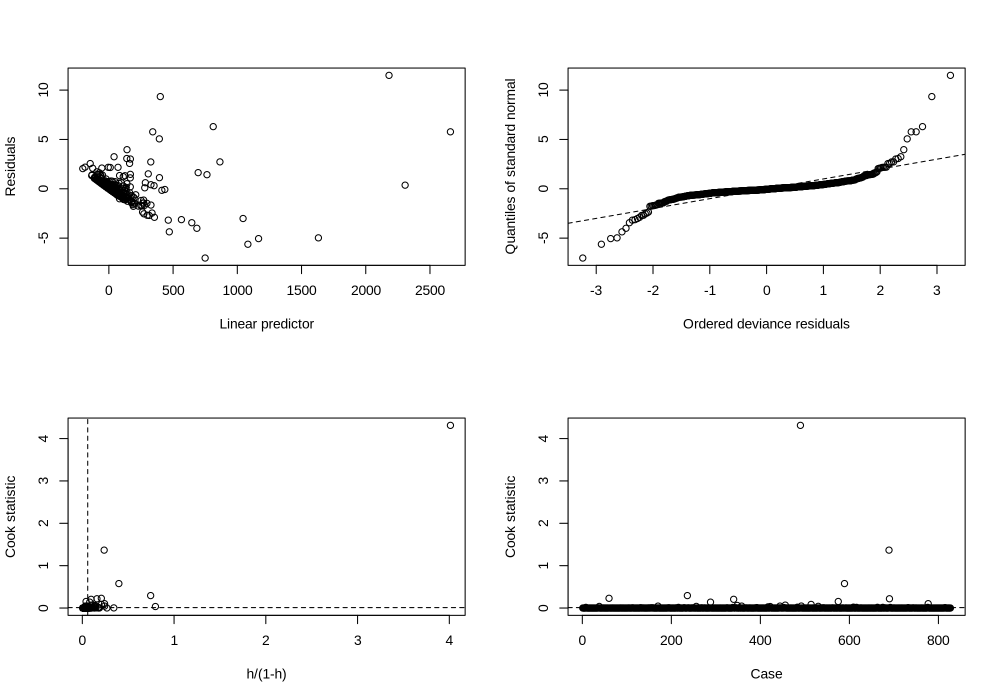

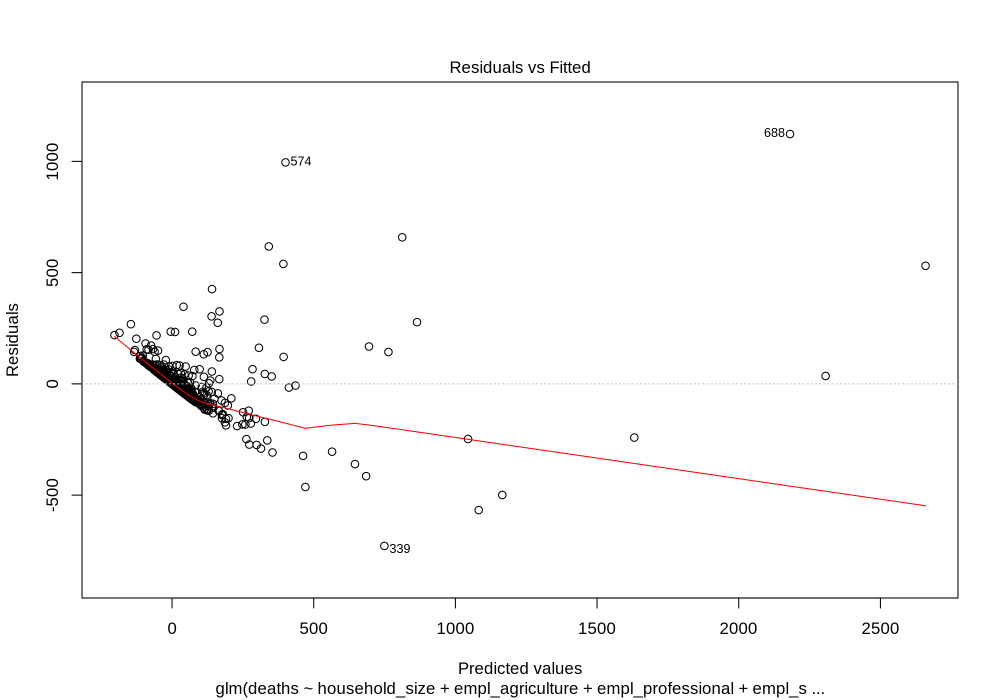

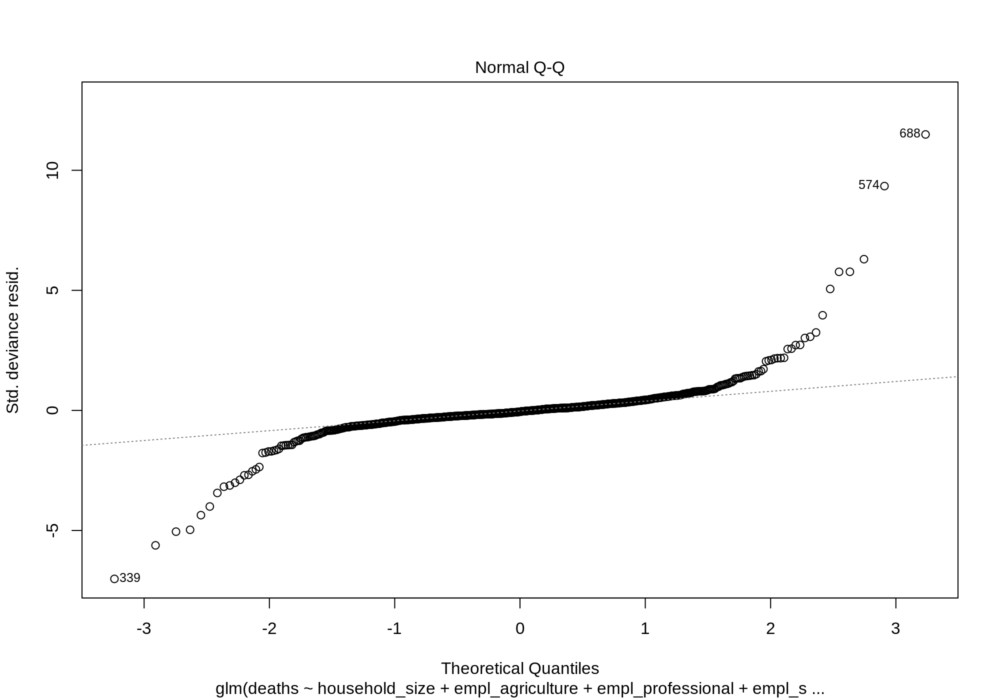

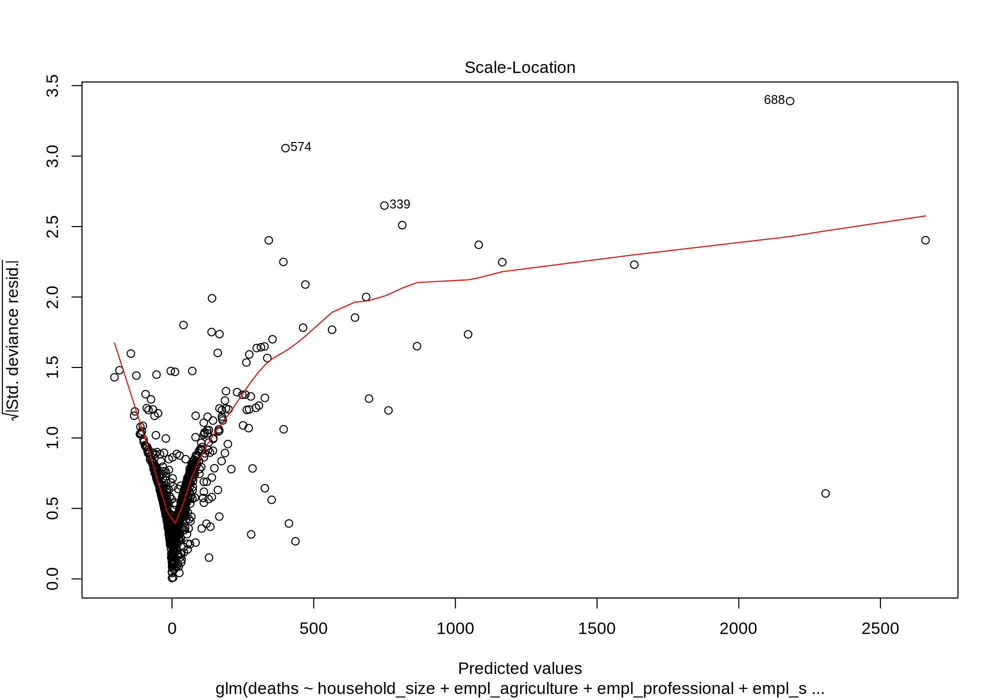

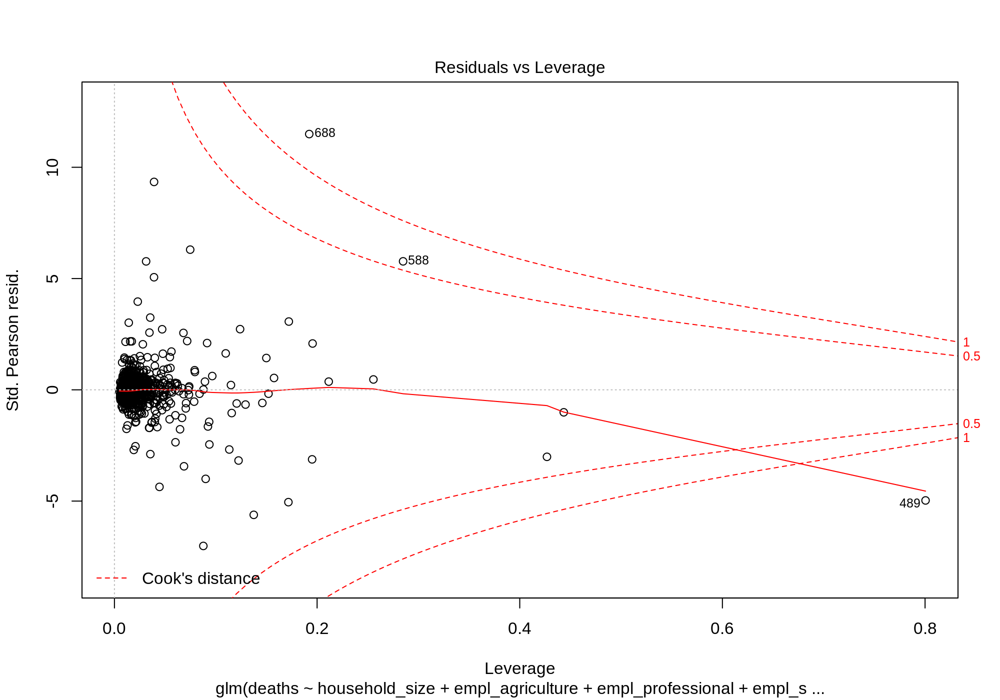

In [52]:
%%R -i abbrev -w 10 -h 7 --units in -r 200
library(boot)
mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [40]:
%%R 

cv_glm$delta

# https://stat.ethz.ch/R-manual/R-devel/library/boot/html/cv.glm.html
# The first component is the raw cross-validation estimate of prediction error. 
# The second component is the adjusted cross-validation estimate.
# The adjustment is designed to compensate for the bias introduced by not using leave-one-out cross-validation. 

# so adj. cv-error=14857.07

[1] 15097.57 14857.07


In [42]:
formulas[1]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'

[1] 8204.536 7996.771

Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density + cases_march24, family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-717.07   -20.71    -4.20    13.22   890.35  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            50.05441    2.58805  19.341  < 2e-16 ***
household_size         -1.05446    3.57614  -0.295  0.76818    
empl_agriculture       -3.64881    3.27381  -1.115  0.26538    
empl_professional      -4.61361    5.09954  -0.905  0.36589    
empl_social            -1.12646    3.62377  -0.311  0.75599    
empl_services          

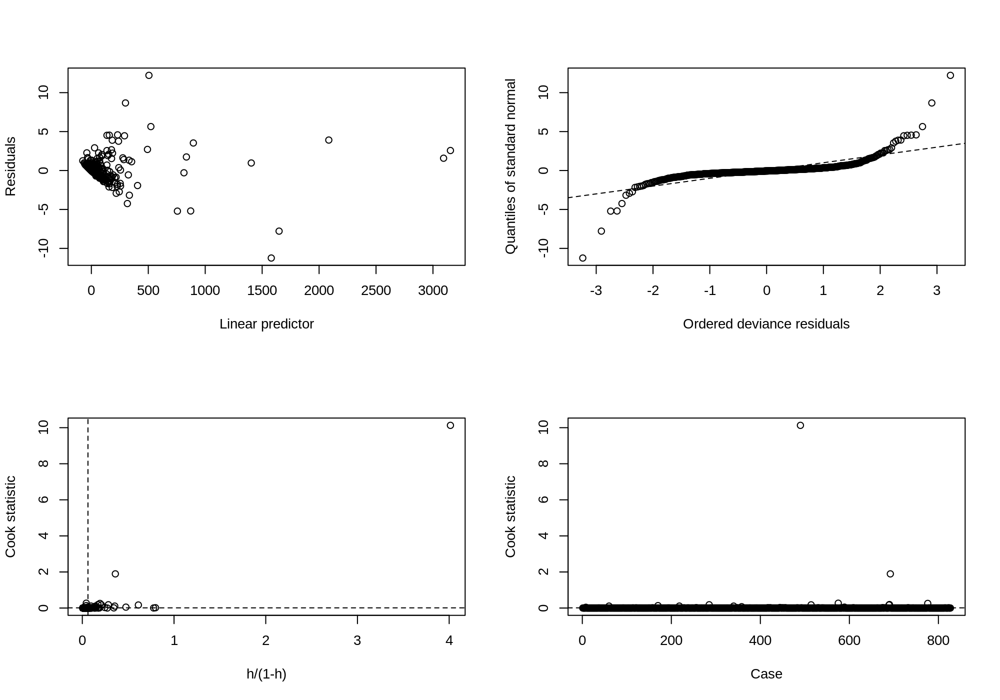

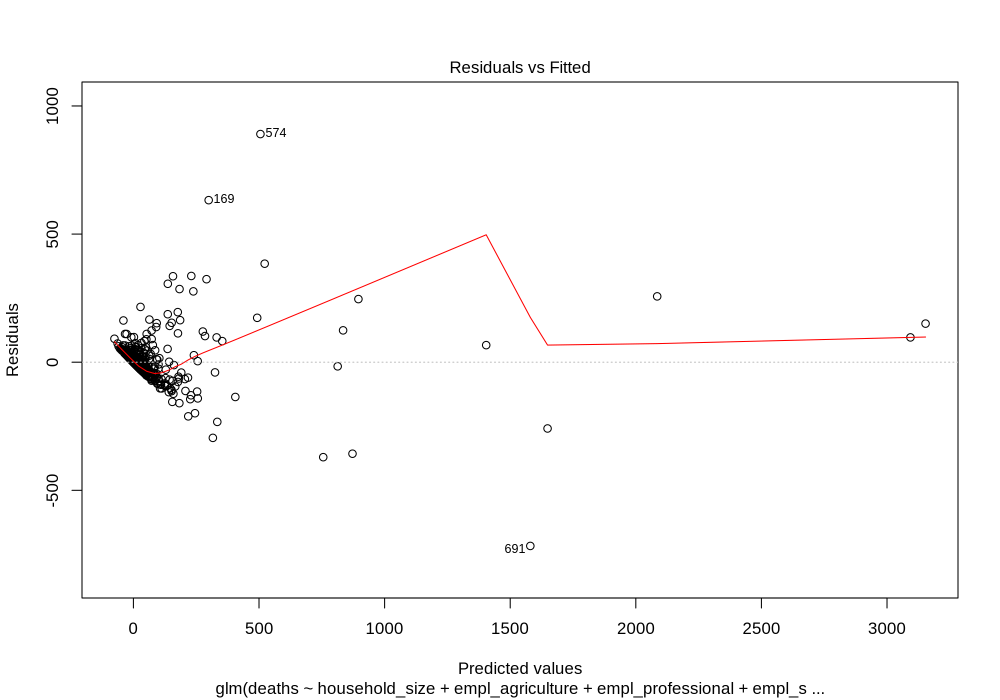

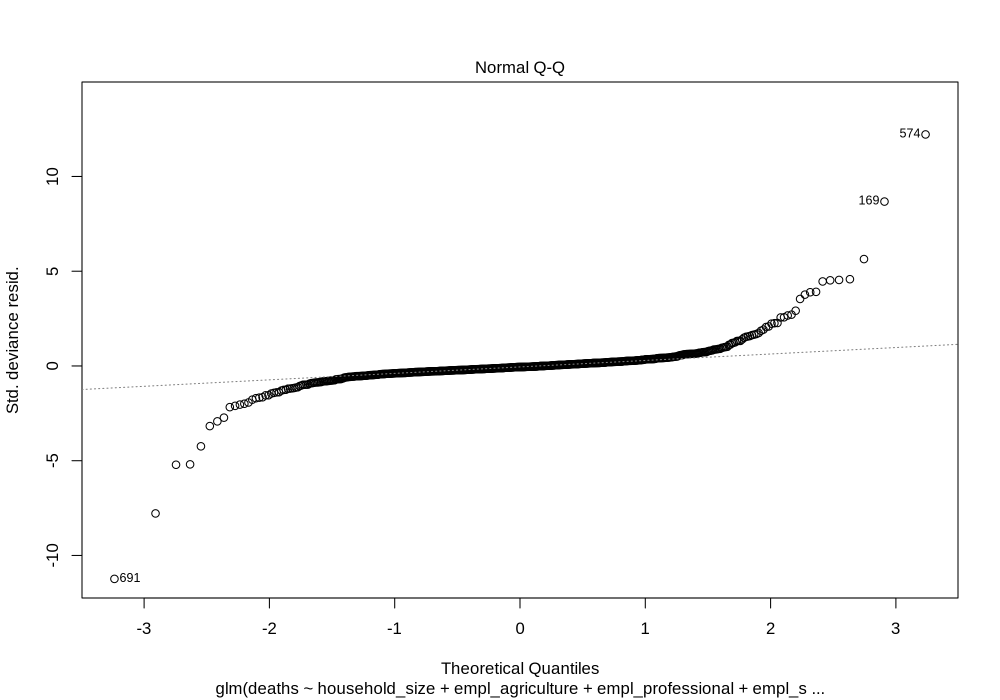

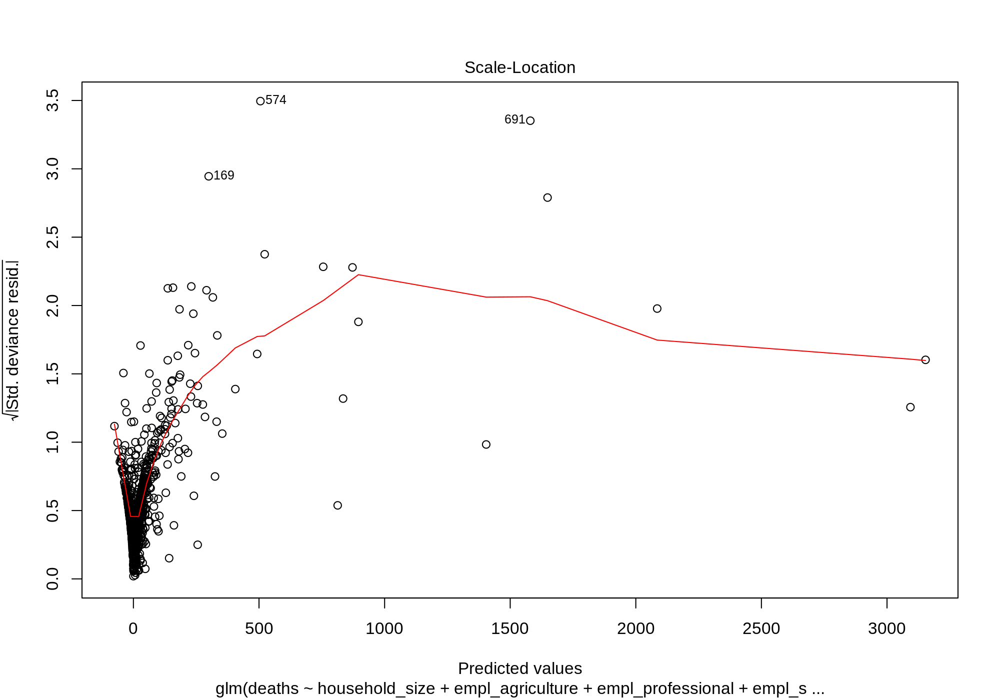

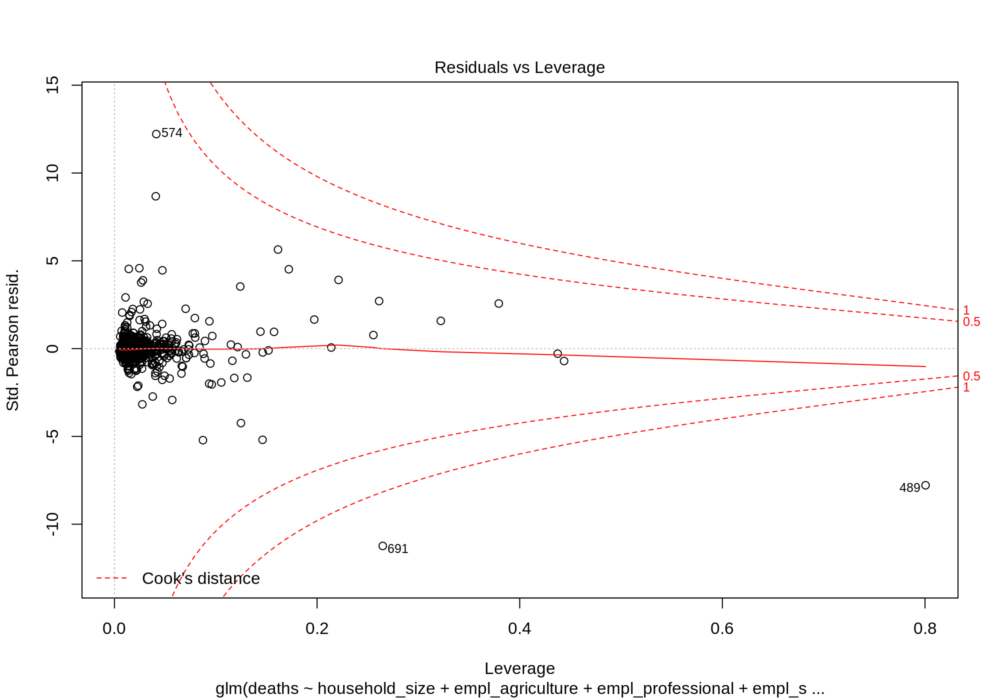

In [53]:
%%R -i abbrev -w 10 -h 7 --units in -r 200

mod = glm(formula =deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + 
          incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + 
          density + cases_march24, 
          family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [45]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 32178.97 31998.00

Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-590.43   -64.99     0.53    53.11  2246.79  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)                50.054      5.992   8.354 2.88e-16 ***
household_size              3.657      8.167   0.448 0.654481    
empl_professional         -41.332     11.885  -3.478 0.000533 ***
empl_social               -11.996      8.432  -1.423 0.155239    
empl_services             -17.712      7.389  -2.397 0.0

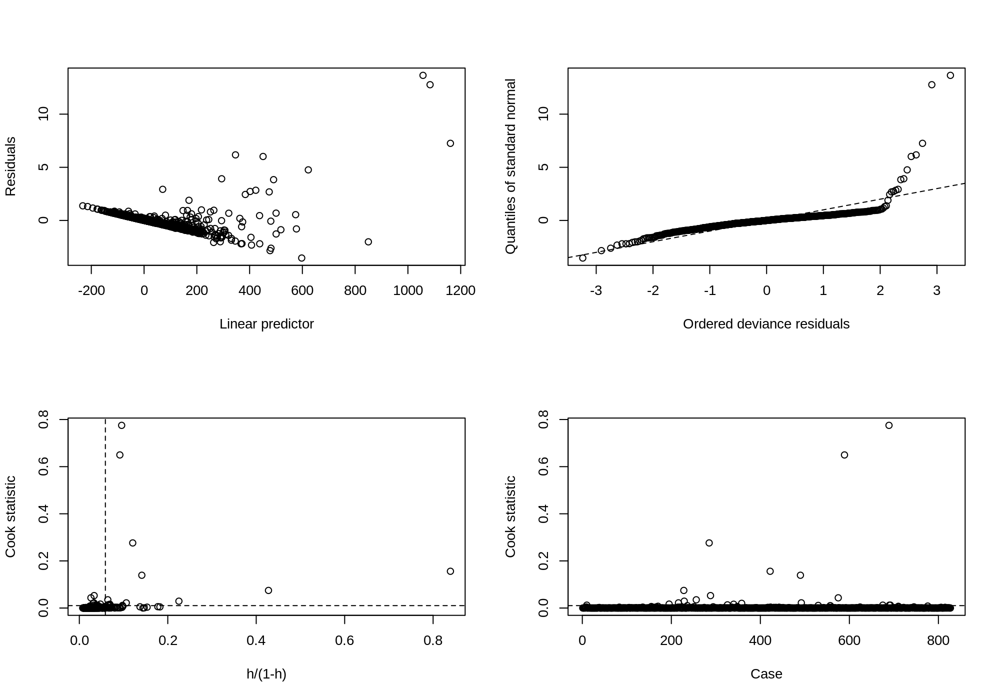

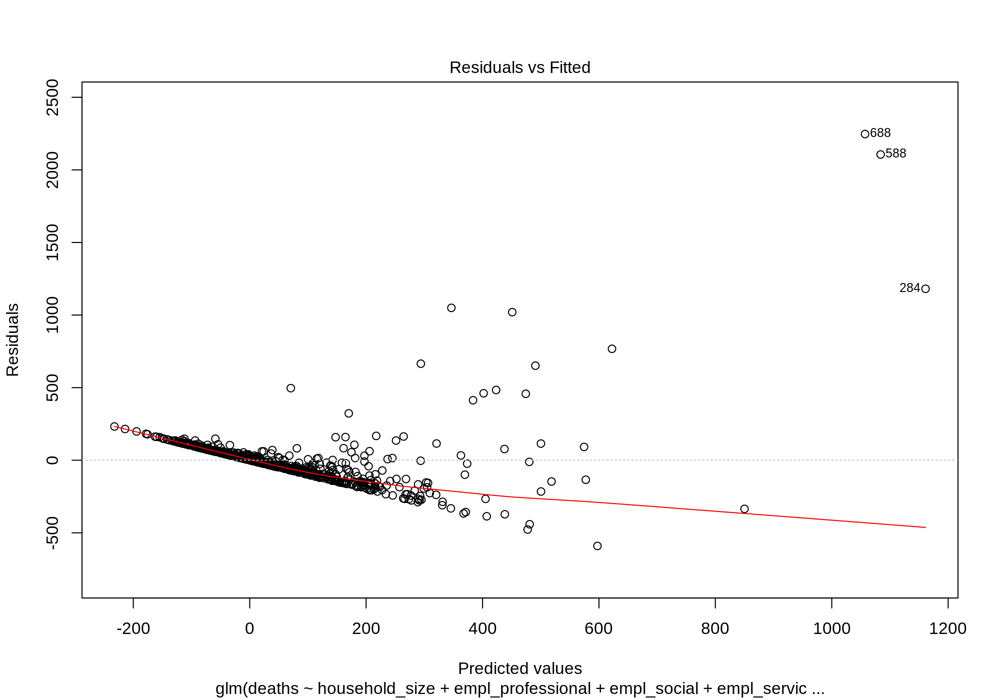

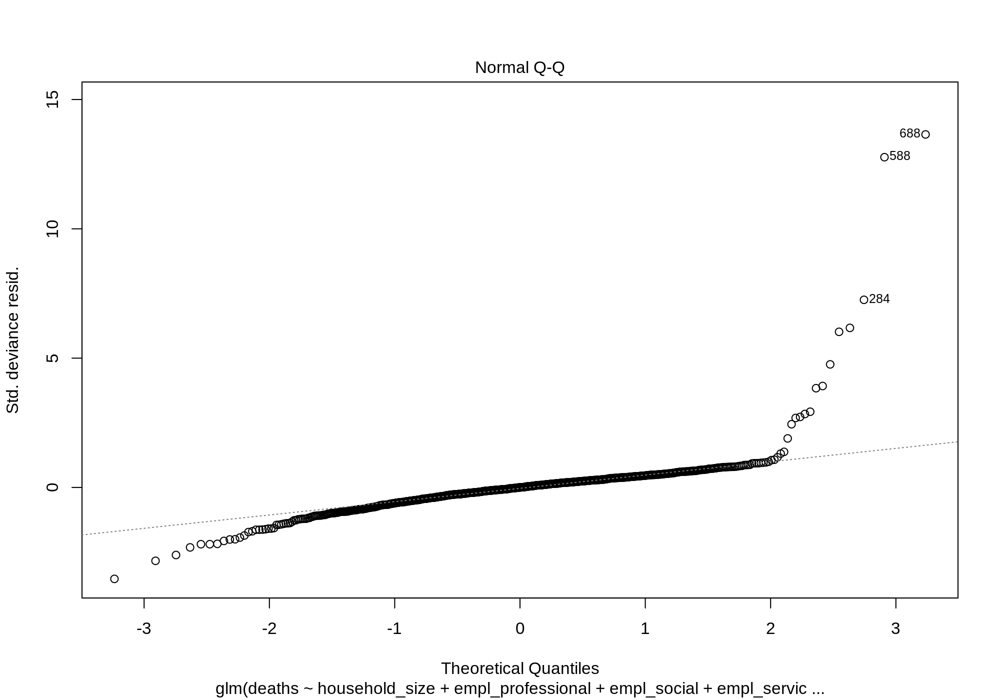

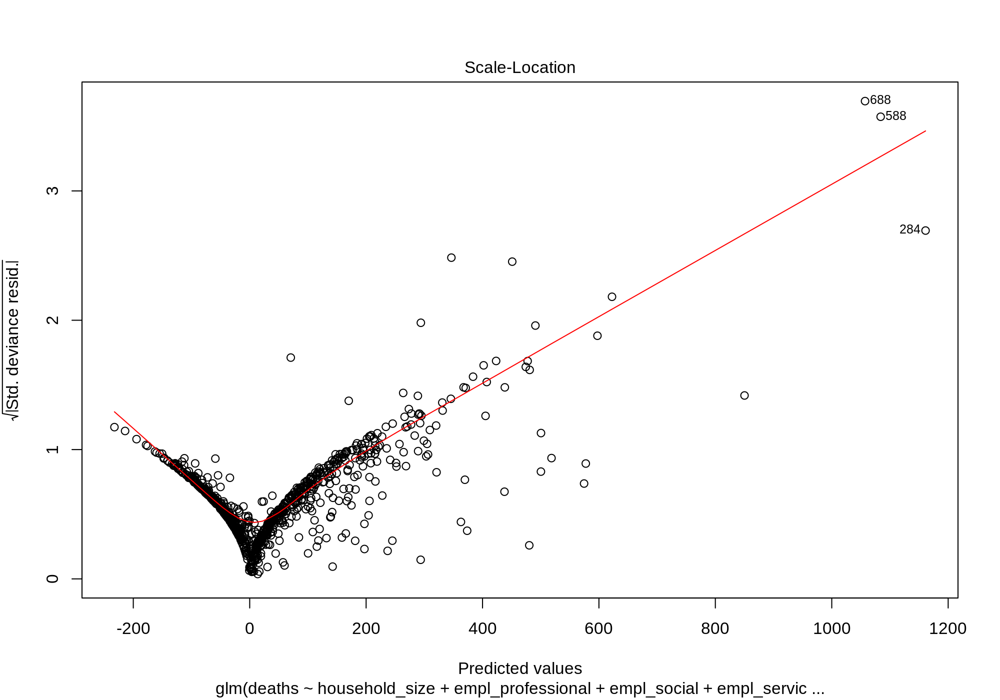

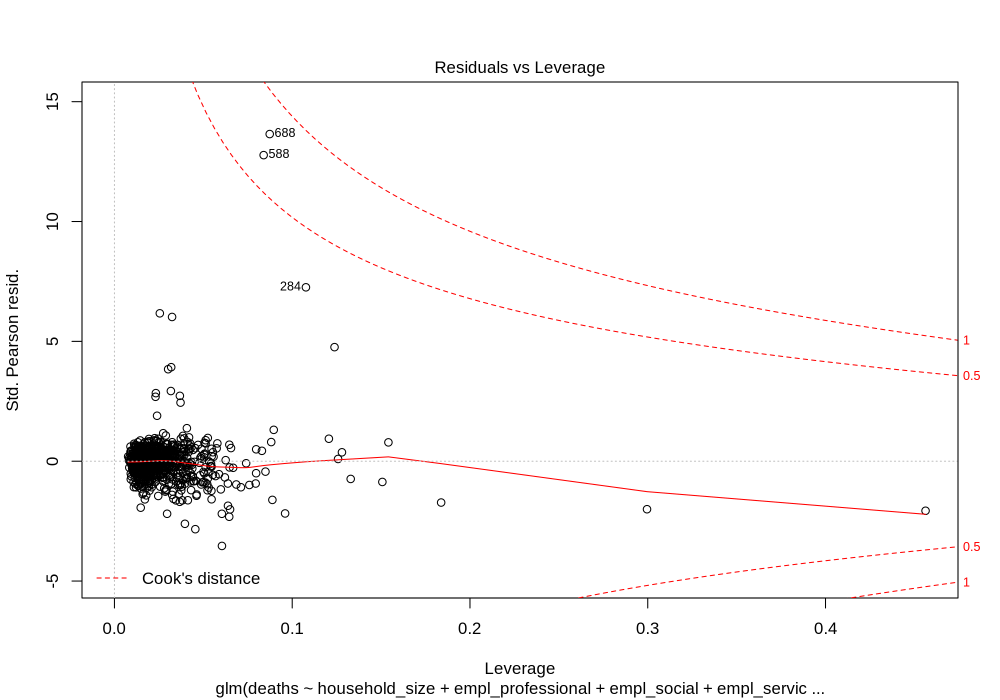

In [54]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services +
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp, 
          family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [48]:
formulas[3]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 28852.99 28652.72

Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_cases_march24 + log_incarcerated + log_empl_agriculture + 
    log_prc_public_transp, family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-514.04   -67.30    -5.68    56.44  2092.95  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)                50.054      5.606   8.929  < 2e-16 ***
household_size              3.244      7.641   0.425  0.67130    
empl_professional         -32.219     11.151  -2.889  0.00397 ** 
empl_social               -12.566      7.889  -1.593  0.11159    
empl_services             -15.881   

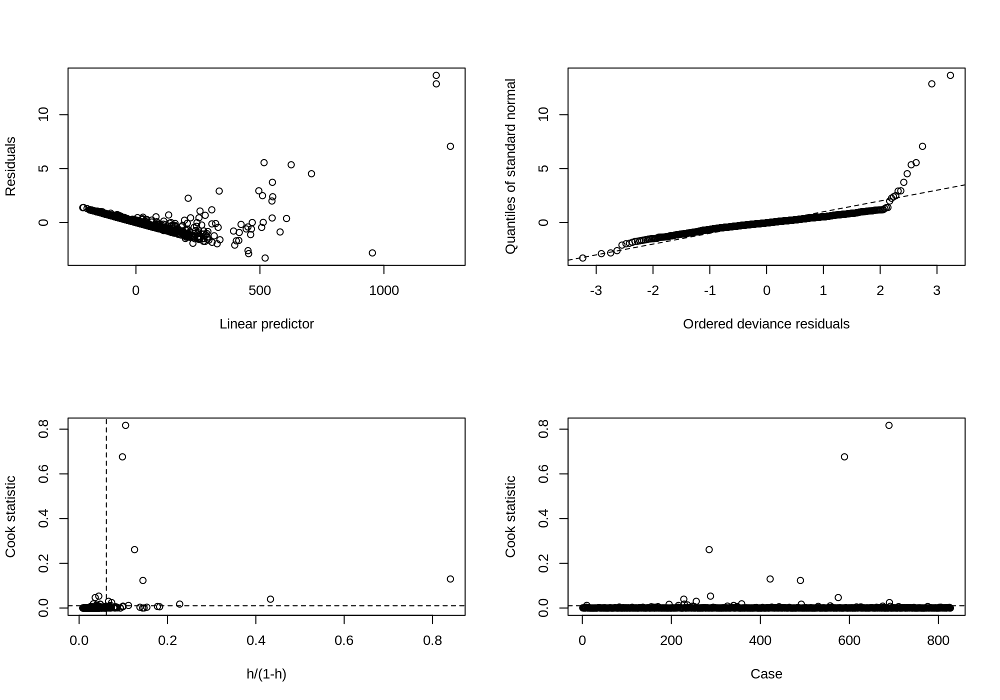

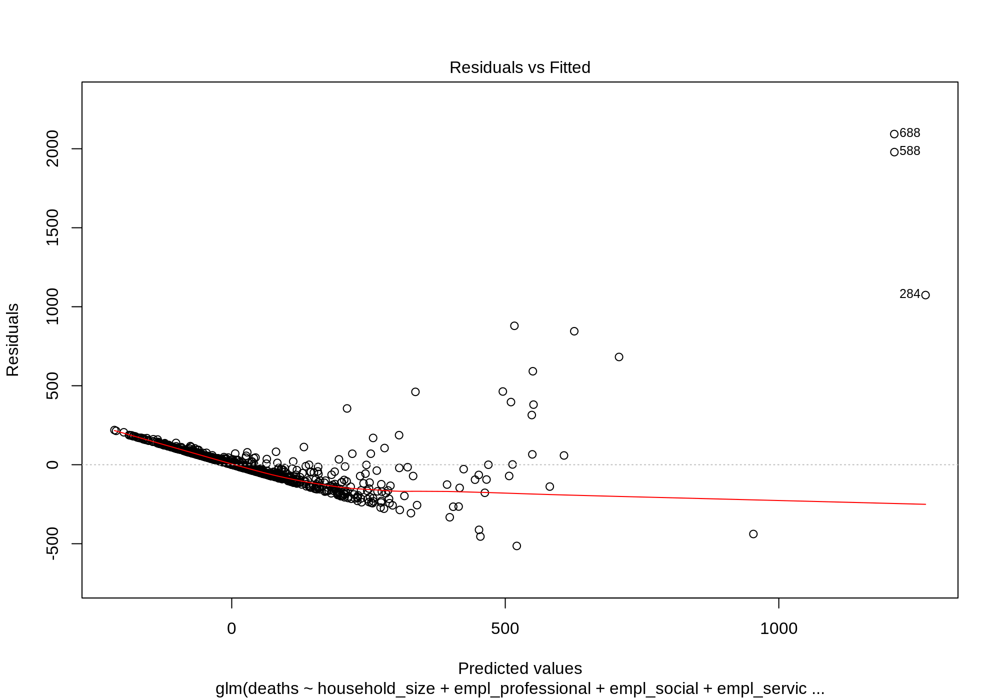

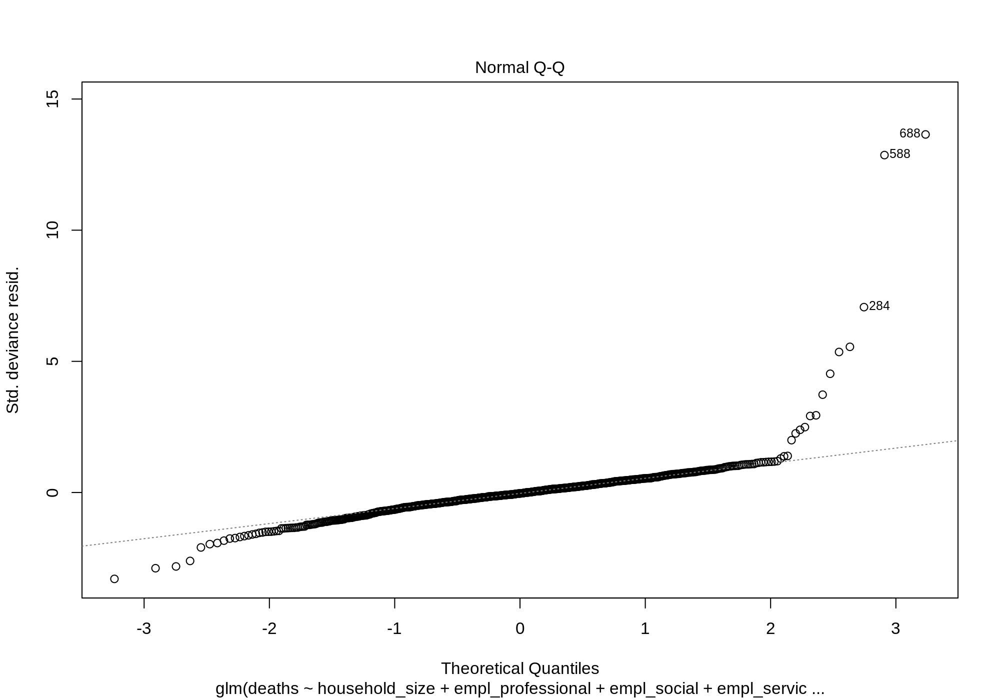

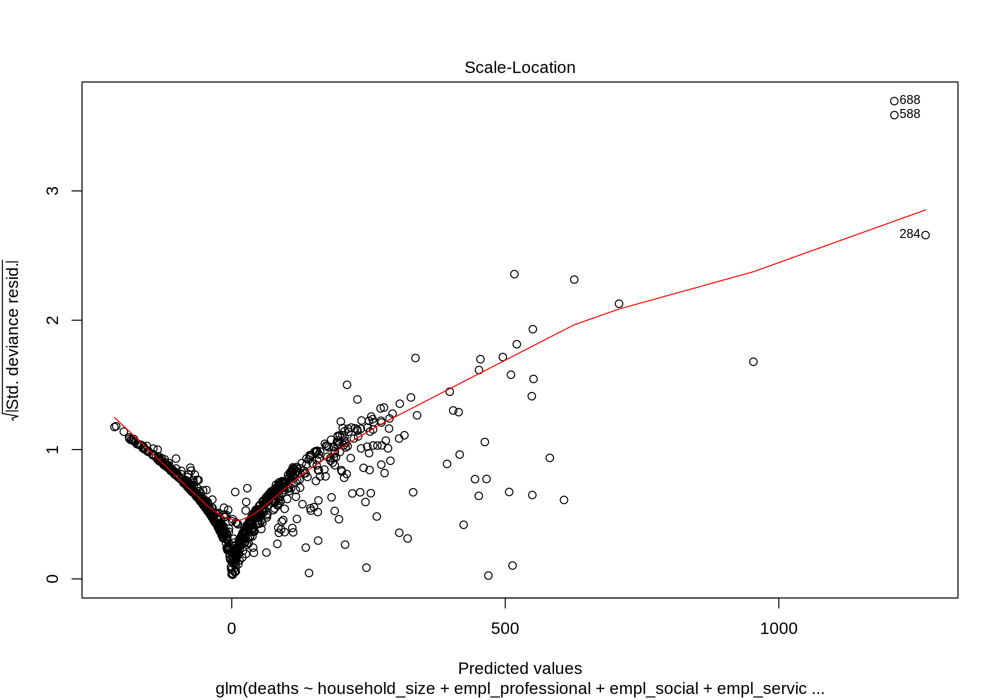

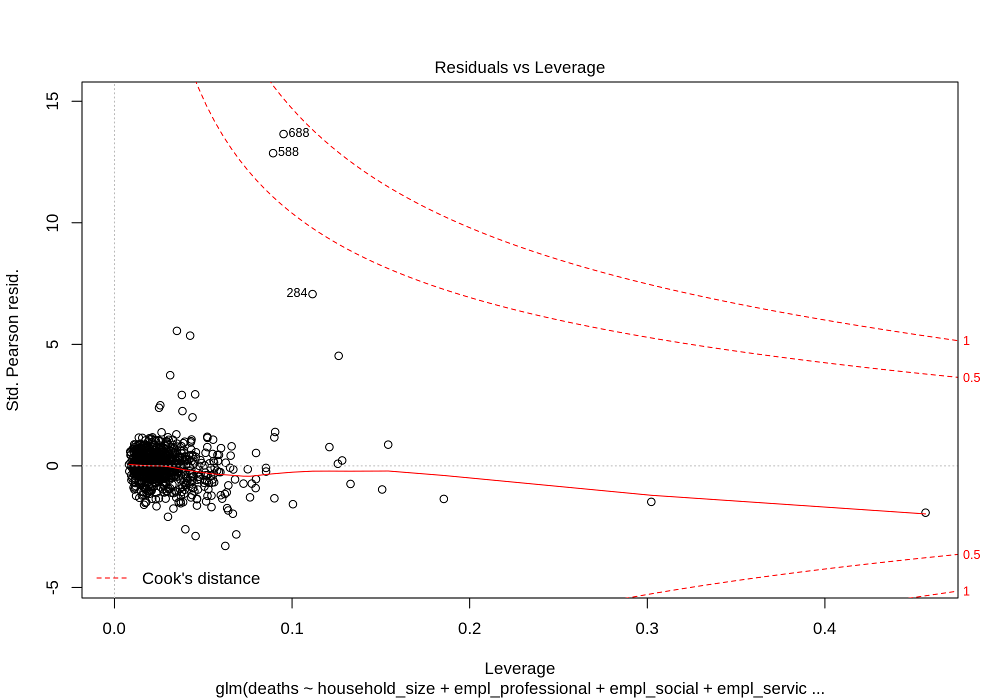

In [55]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

## Linear Regression with Transformed Target

[1] 1.061554 1.056123

Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, family = gaussian, 
    data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.5200  -0.6377  -0.0266   0.6223   3.0881  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.076141   0.034767  59.716  < 2e-16 ***
household_size         0.009775   0.047973   0.204 0.838587    
empl_agriculture      -0.095267   0.043979  -2.166 0.030588 *  
empl_professional     -0.004498   0.068212  -0.066 0.947435    
empl_social            0.026266   0.048680   0.540 0.589652    
empl_services         -0.12551

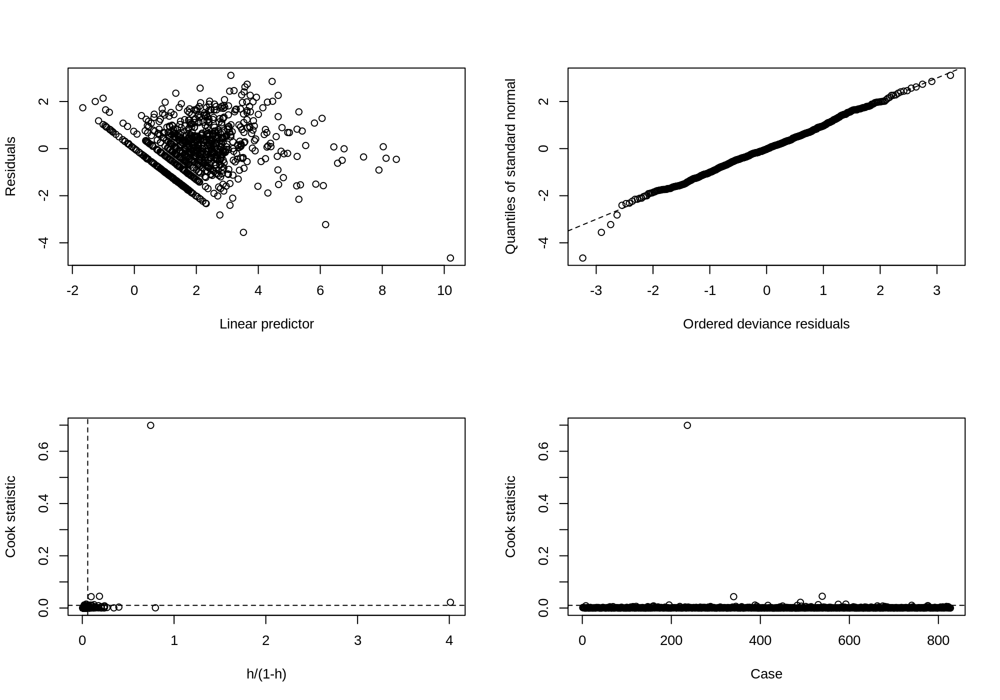

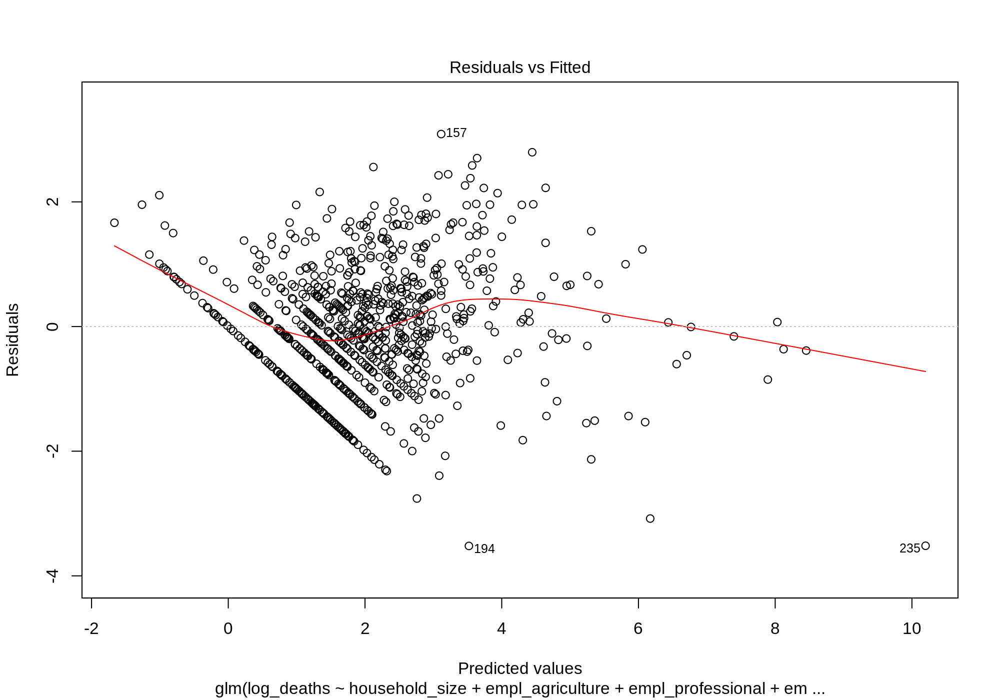

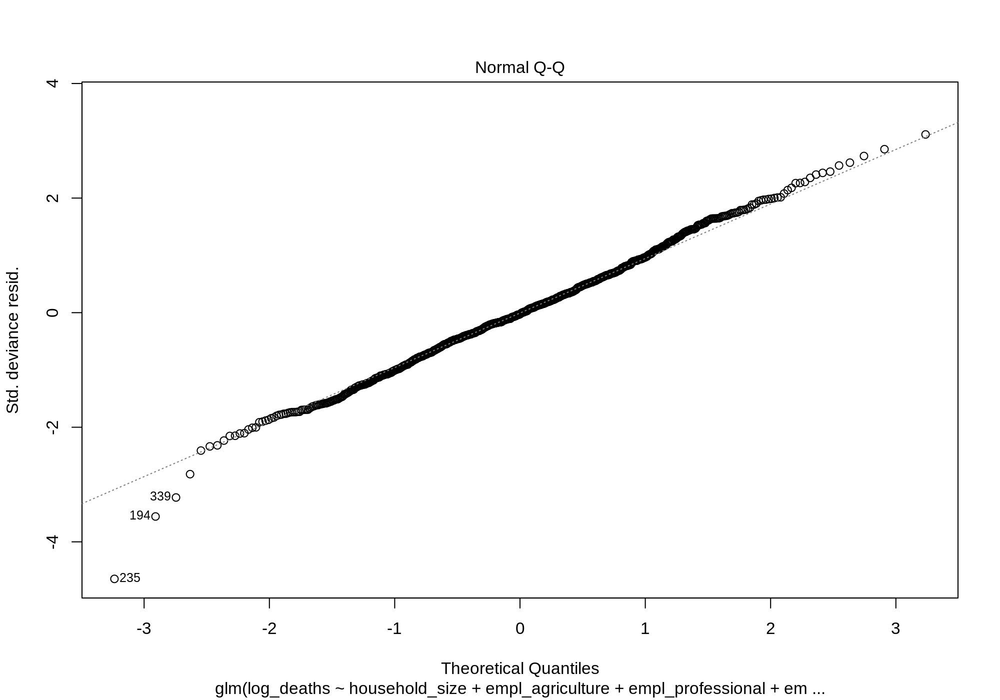

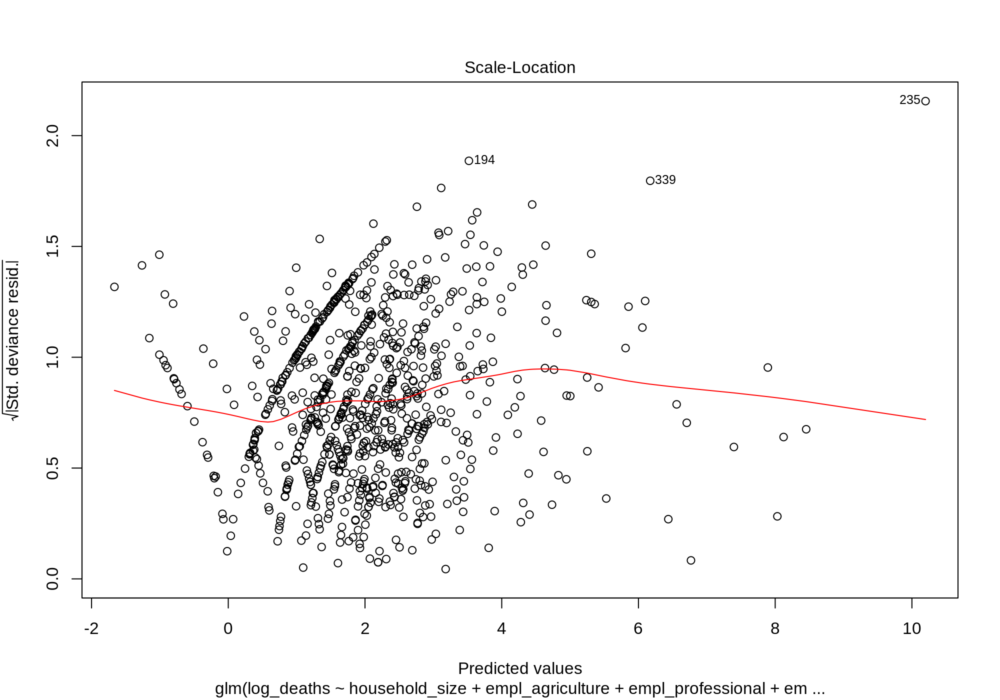

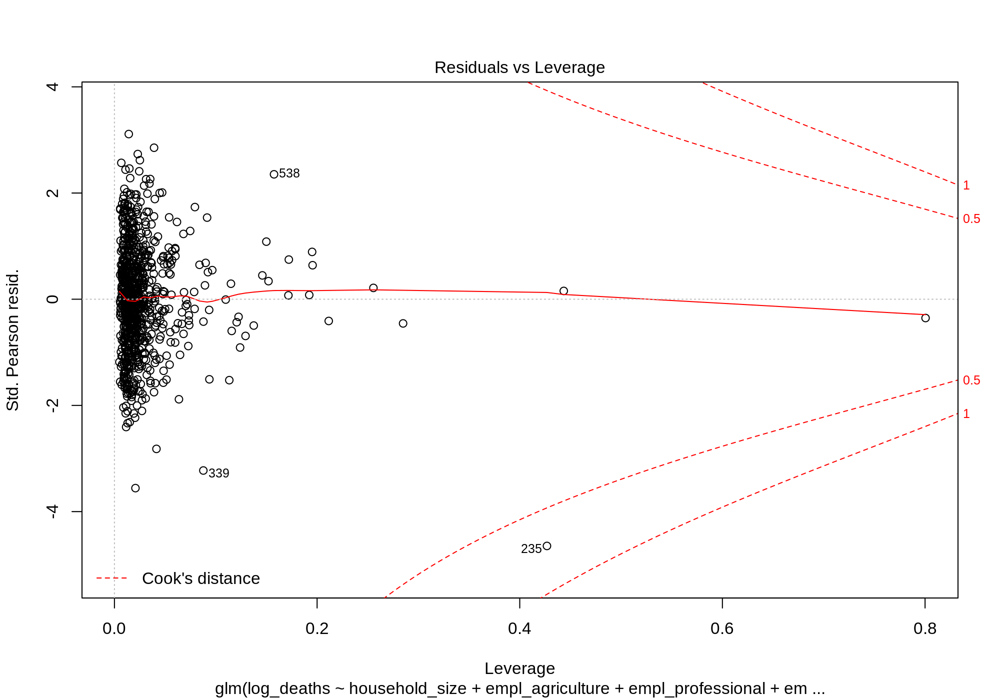

In [56]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [62]:
formulas[1]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'

[1] 1.054056 1.048871

Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density + cases_march24, family = gaussian, 
    data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.4005  -0.6721  -0.0220   0.6293   3.0981  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.076141   0.034676  59.872  < 2e-16 ***
household_size         0.003972   0.047915   0.083 0.933947    
empl_agriculture      -0.094845   0.043864  -2.162 0.030895 *  
empl_professional      0.009906   0.068326   0.145 0.884768    
empl_social            0.026434   0.048553   0.544 0.586288    
empl_services 

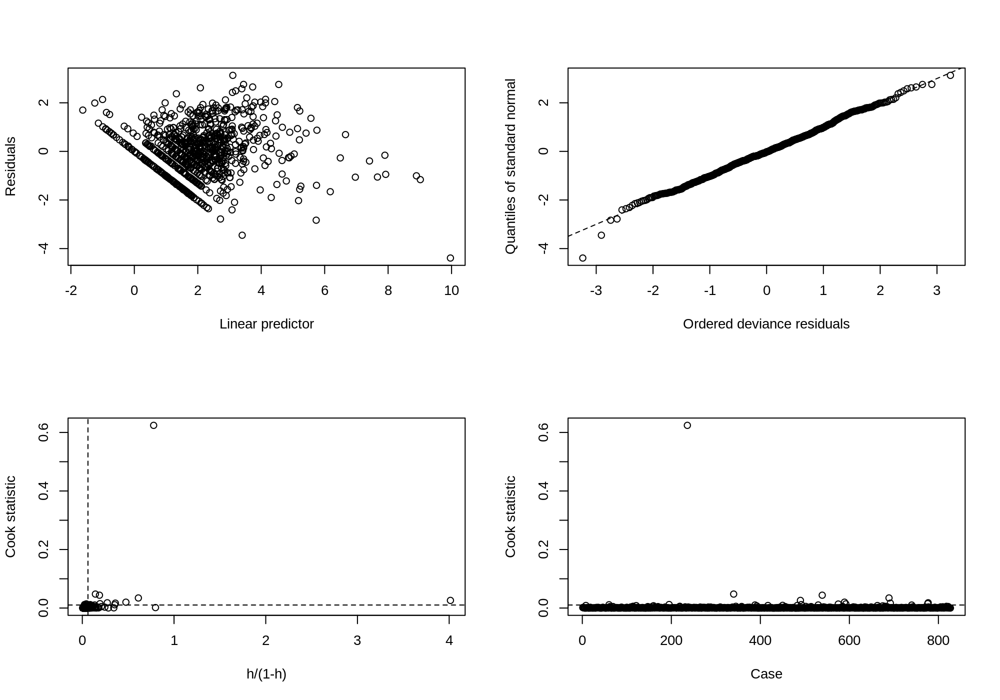

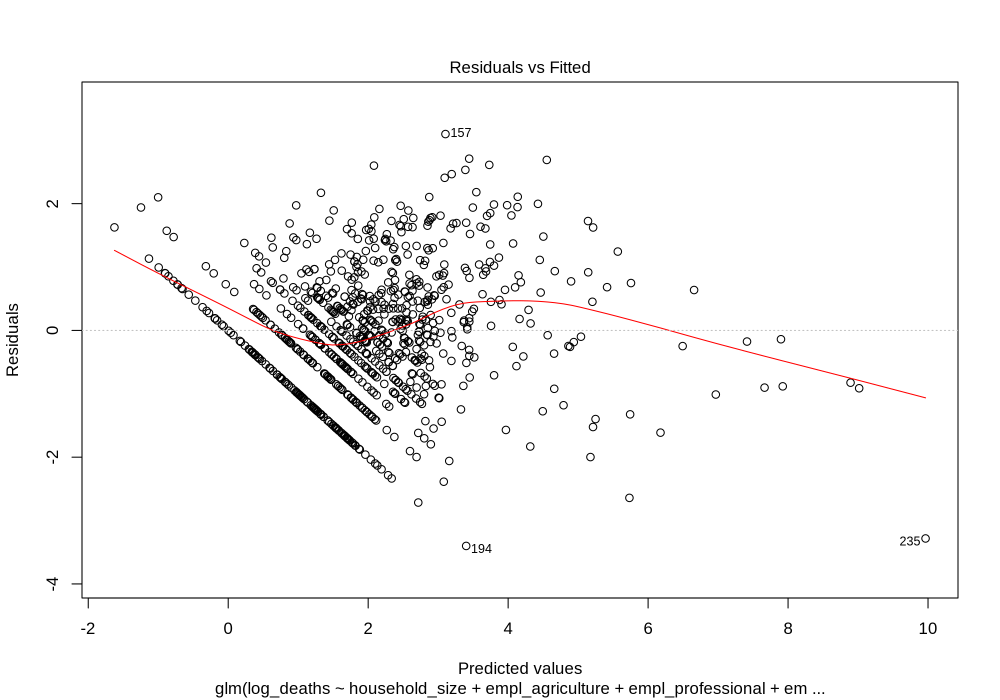

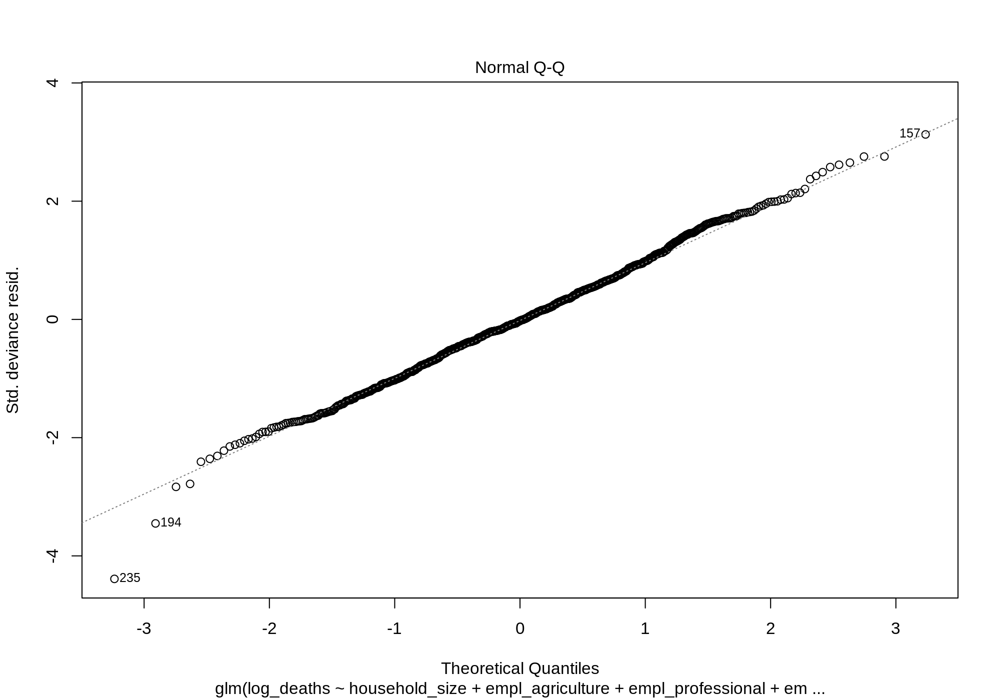

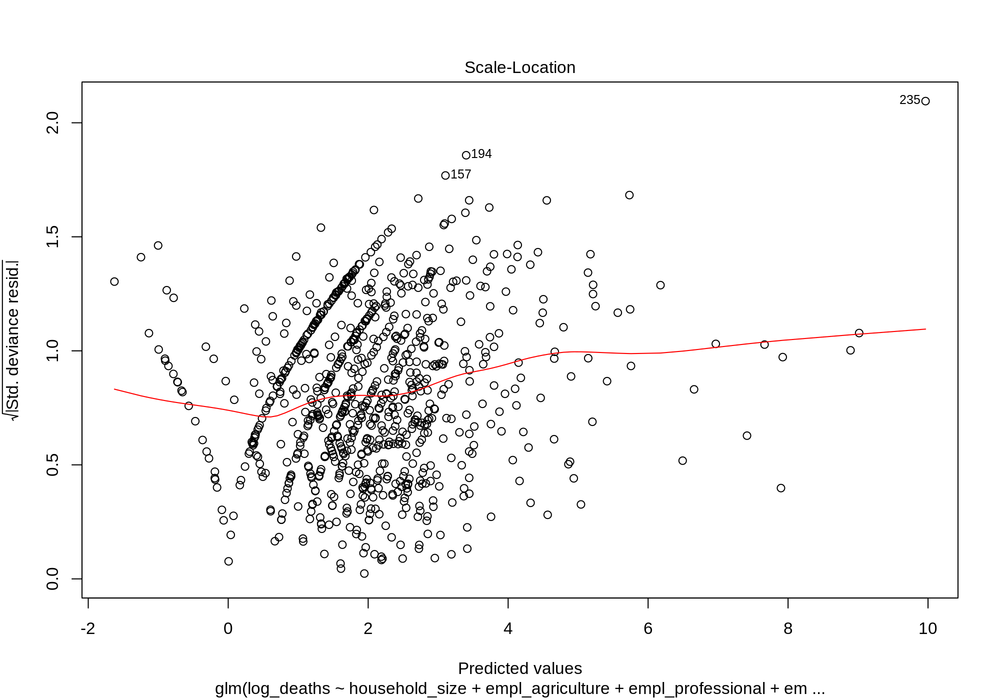

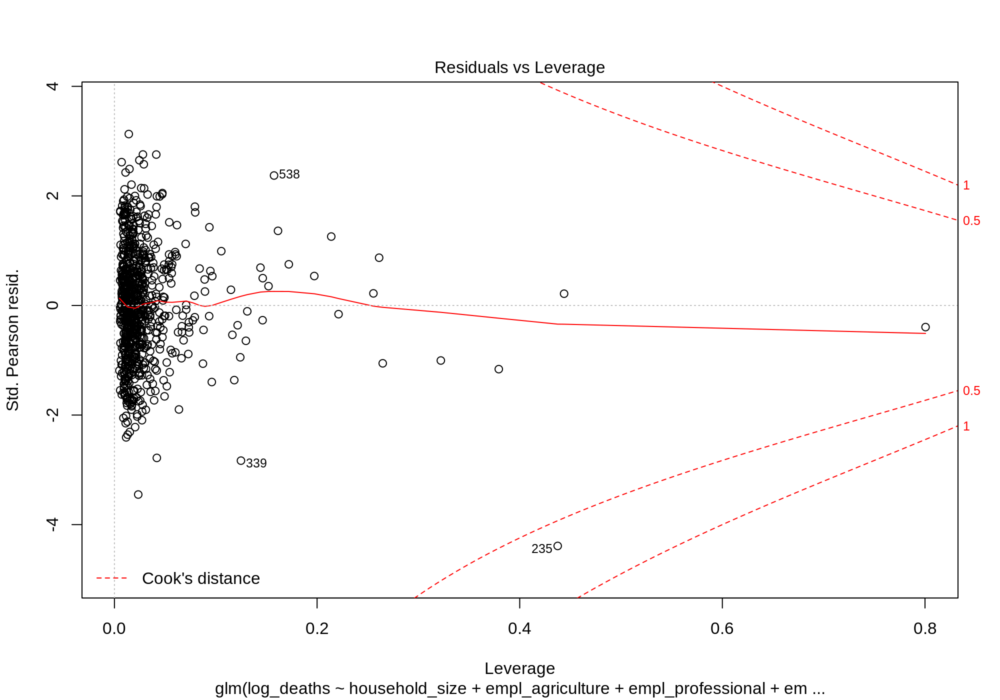

In [63]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density + cases_march24, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [64]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 0.9033930 0.9007616

Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.0697  -0.6374  -0.0030   0.5803   2.4194  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              2.076141   0.032608  63.670  < 2e-16 ***
household_size           0.029466   0.044448   0.663 0.507571    
empl_professional       -0.175556   0.064681  -2.714 0.006786 ** 
empl_social              0.023759   0.045891   0.518 0.604784    
empl_services           -0.122078   0.040211  -3.0

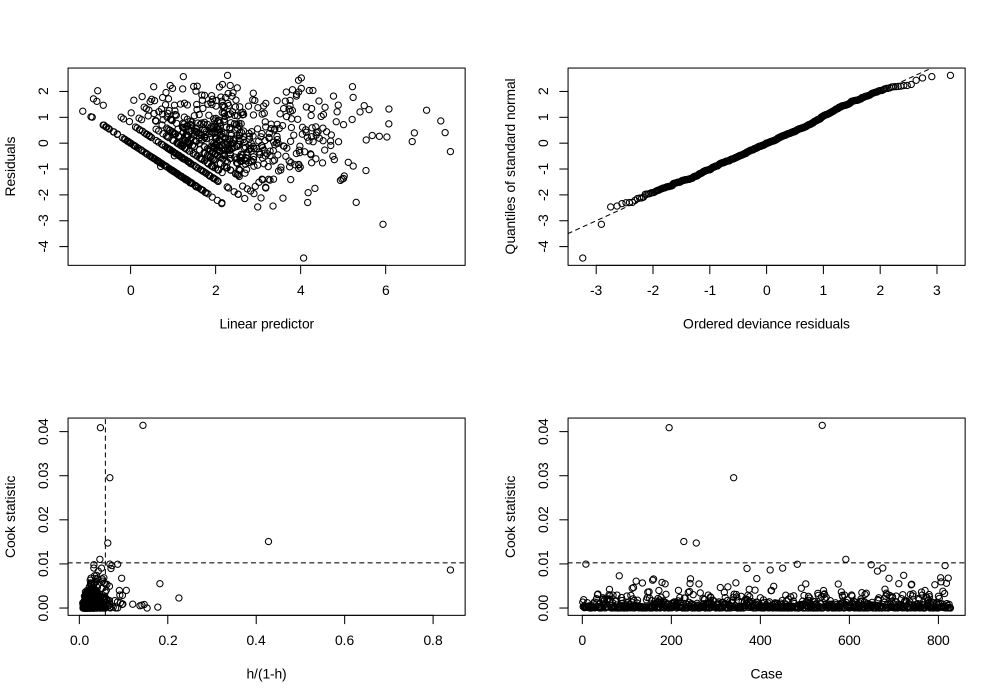

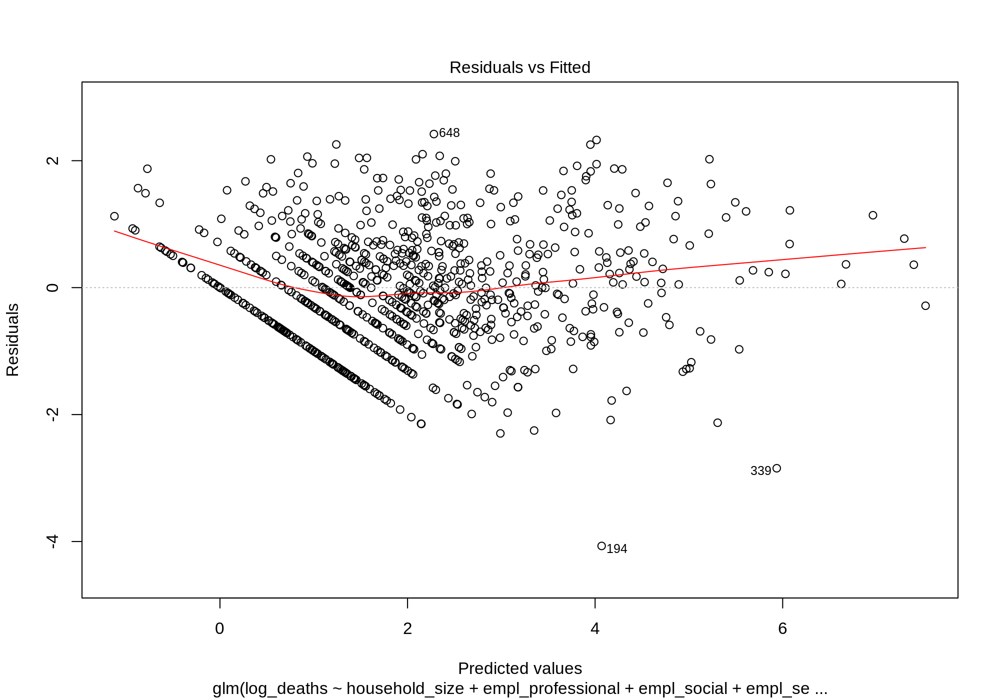

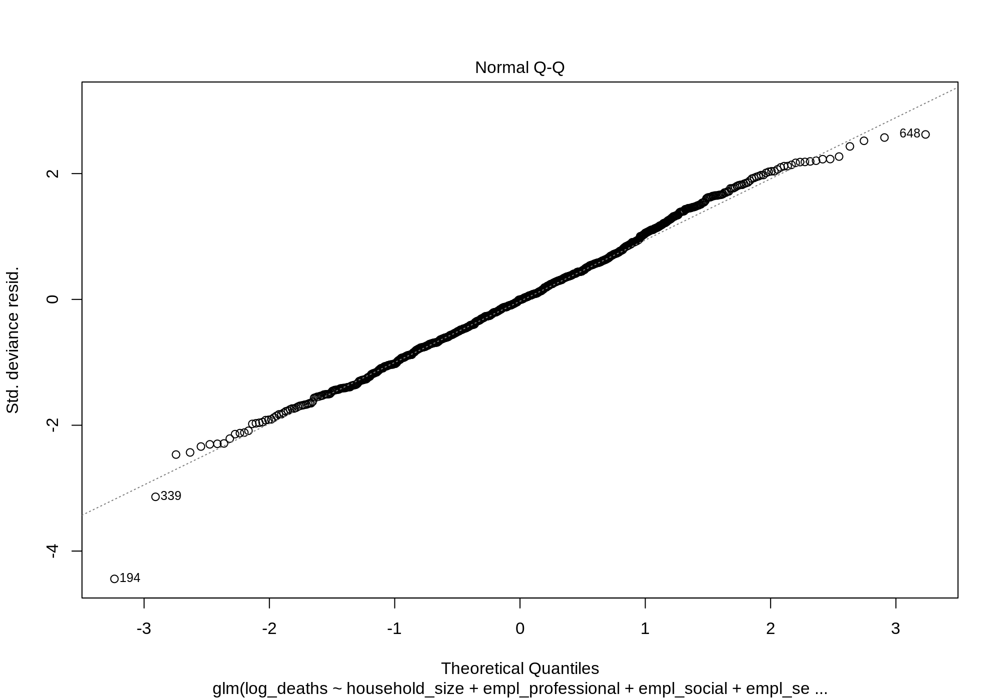

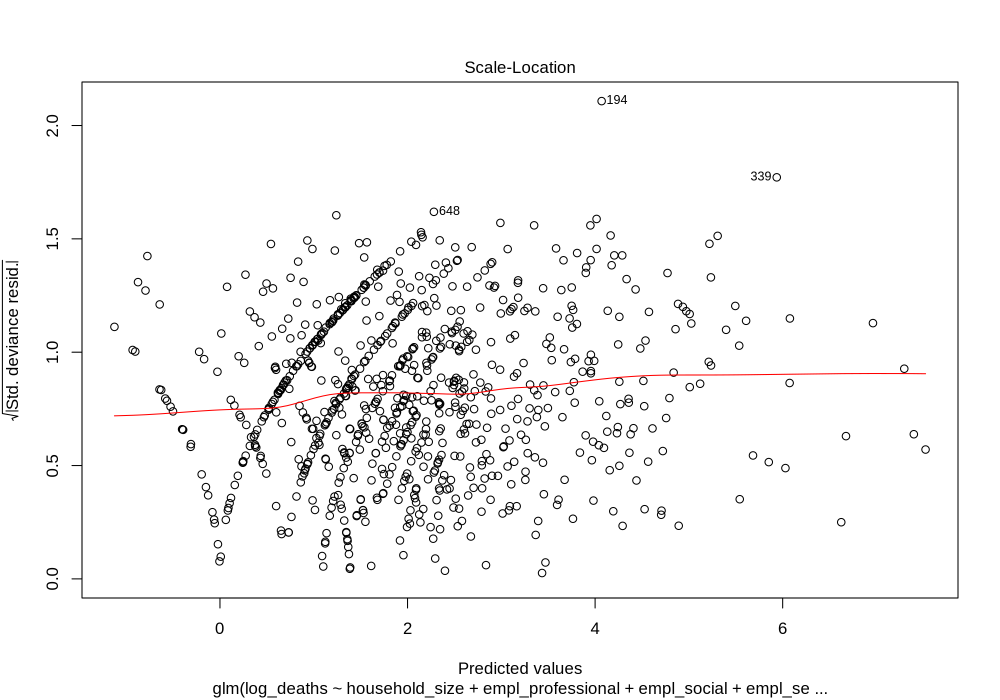

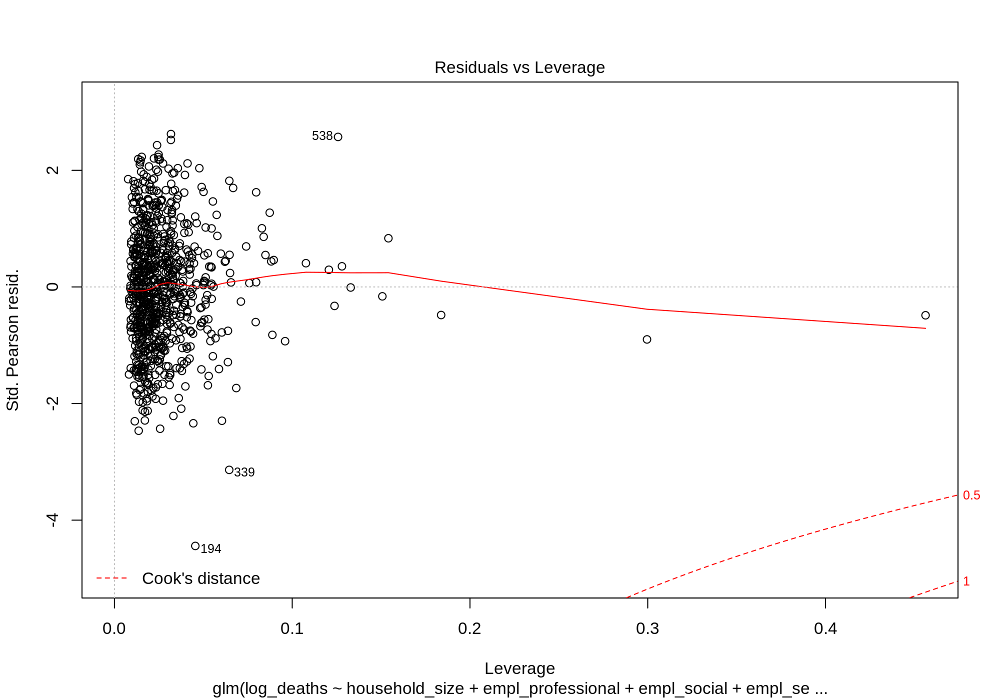

In [65]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp, family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [66]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'

[1] 0.8499992 0.8469500

Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    log_cases_march24, family = gaussian, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-3.9755  -0.6080  -0.0324   0.6003   2.3075  

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)              2.0761406  0.0314407  66.034  < 2e-16 ***
household_size           0.0277727  0.0428578   0.648 0.517157    
empl_professional       -0.1381815  0.0625466  -2.209 0.027438 *  
empl_social              0.0214208  0.0442491   0.484 0.628450    
empl_services           -

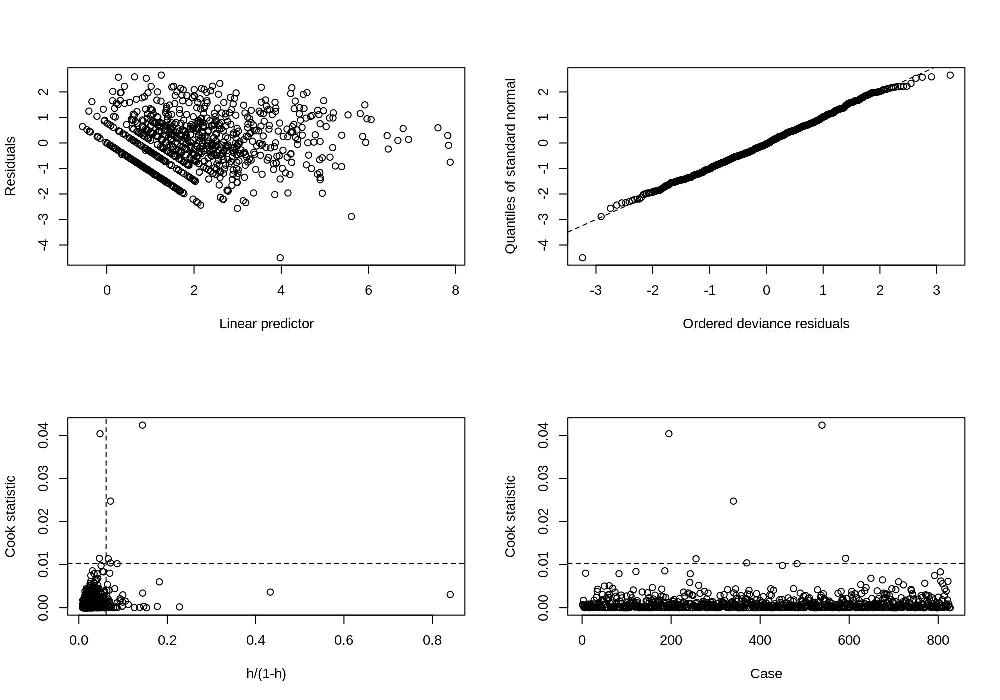

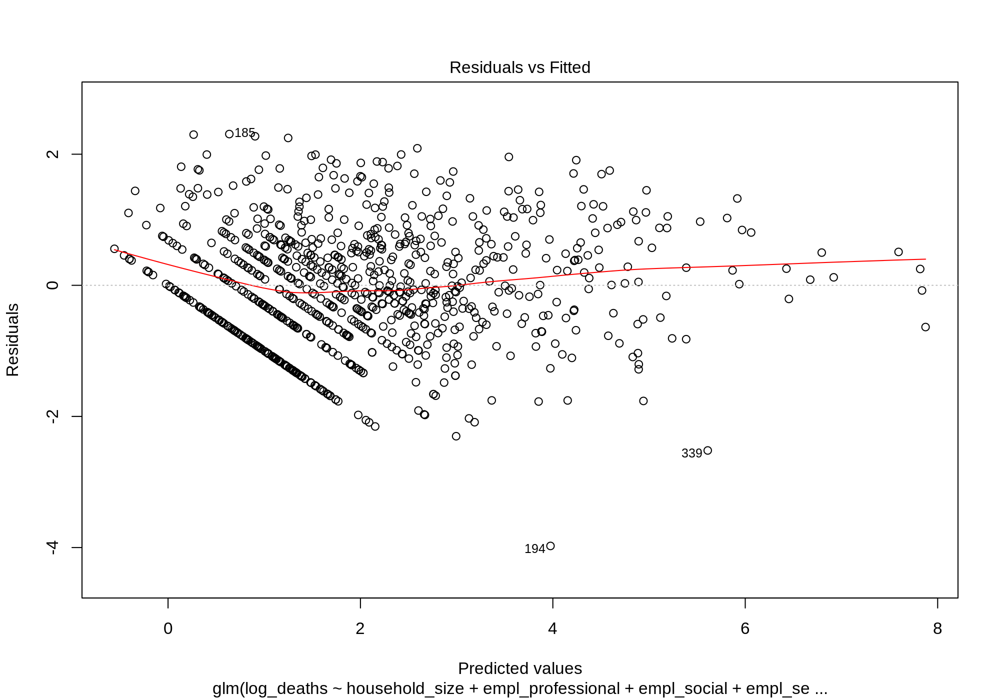

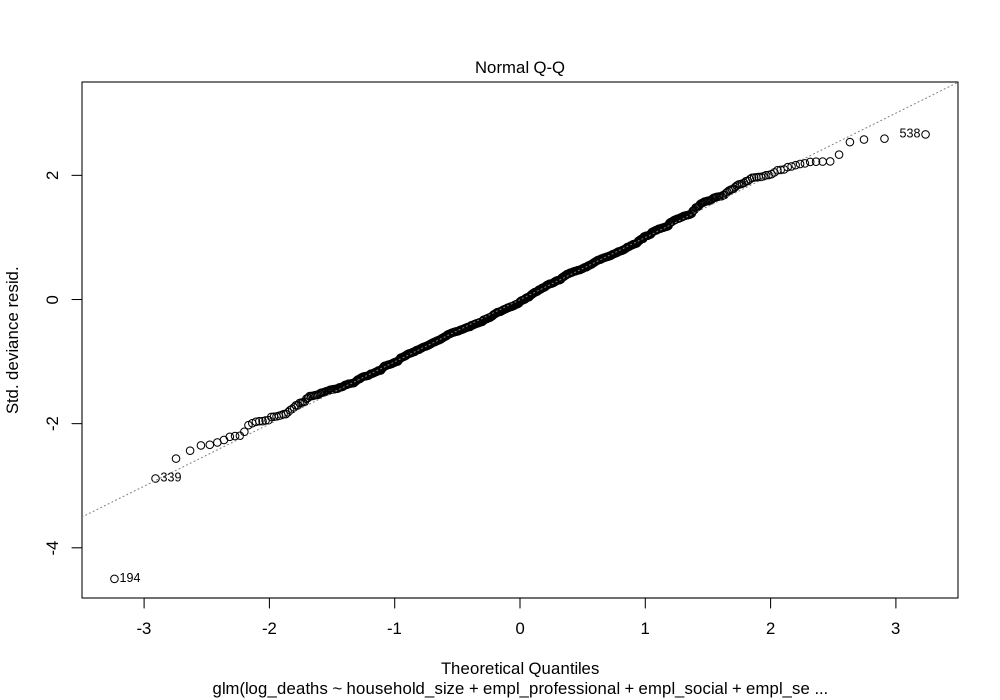

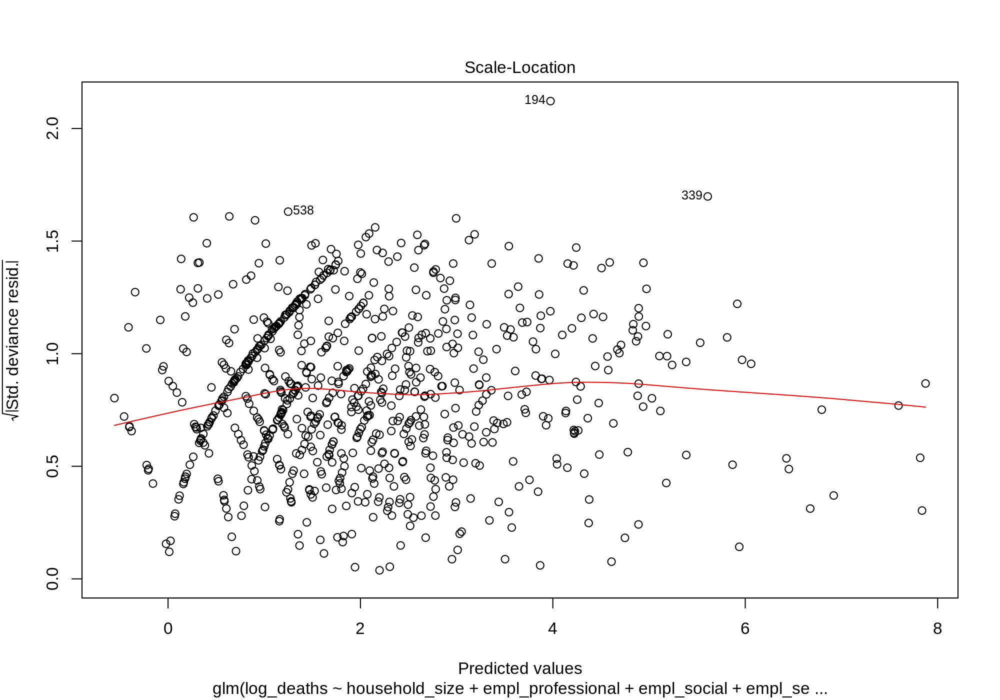

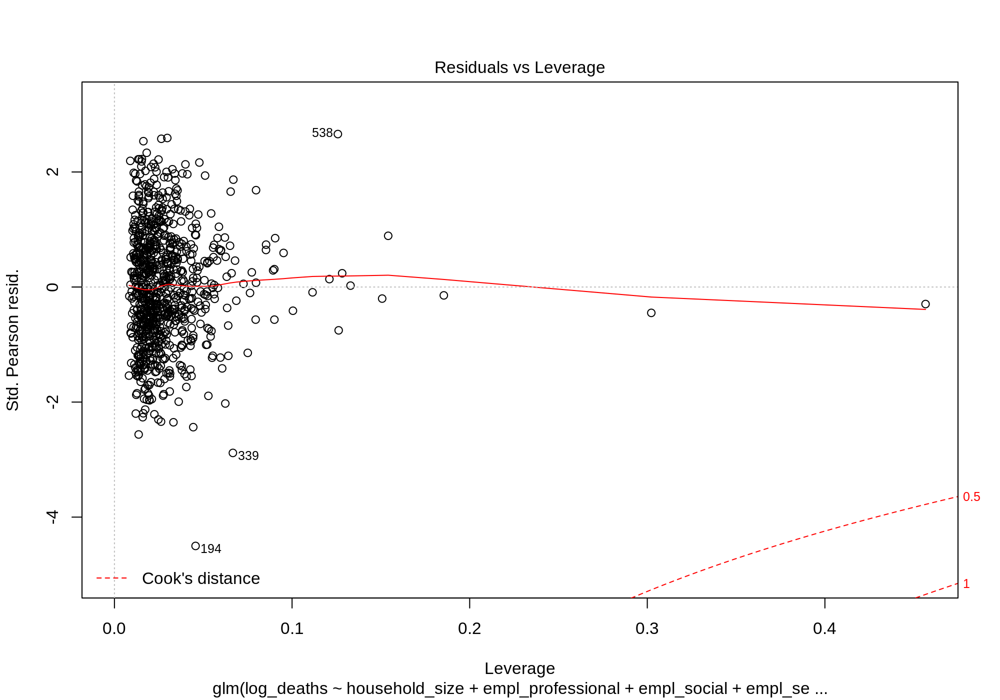

In [67]:
%%R -w 10 -h 7 --units in -r 200

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
          pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + 
          log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + 
          log_empl_agriculture + log_prc_public_transp + log_cases_march24, 
          family = gaussian, data = abbrev)


cv_glm <- cv.glm(abbrev, mod, K = 10)
print(cv_glm$delta)
glm.diag.plots(mod, glm.diag(mod))
plot(mod)
print(summary(mod))

In [ ]:
# linear models with interactions??

## Poisson-Family GLM

Using R via r-magic since found difficult to get same functionality plotting from statsmodels without lots of time-consuming internet searches

In [19]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'

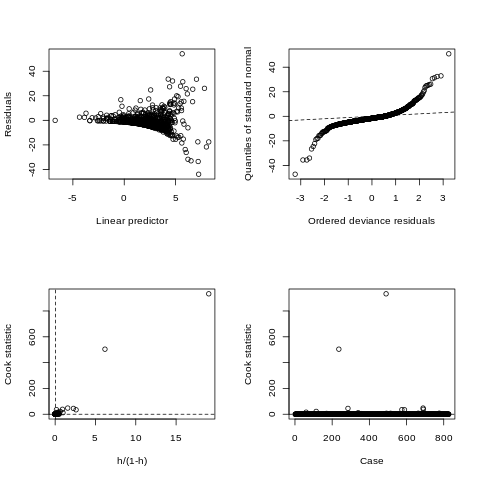

In [22]:
%%R -i abbrev
library(boot)
mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = poisson(link = "log"), data = abbrev)


cv_err <- cv.glm(abbrev, mod, K = 10)$delta
glm.diag.plots(mod, glm.diag(mod))

#print(summary(mod))
#plot(mod)


Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = poisson(link = "log"), data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-28.541   -3.748   -1.640    0.711   47.267  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)            2.371038   0.013350 177.603  < 2e-16 ***
household_size         0.026324   0.008487   3.102  0.00192 ** 
empl_agriculture      -0.843034   0.022373 -37.680  < 2e-16 ***
empl_professional     -0.287384   0.013335 -21.551  < 2e-16 ***
empl_social           -0.112237   0.010950 -10.250  < 2e-16 ***
empl_services         -0.332737   0.010351 -32.1

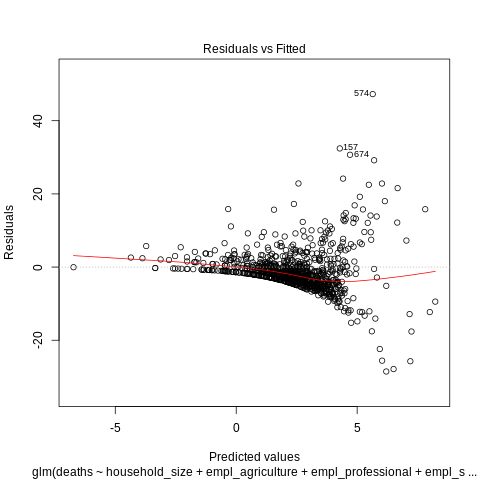

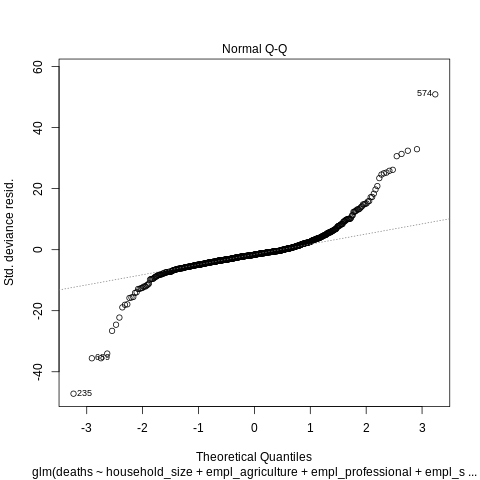

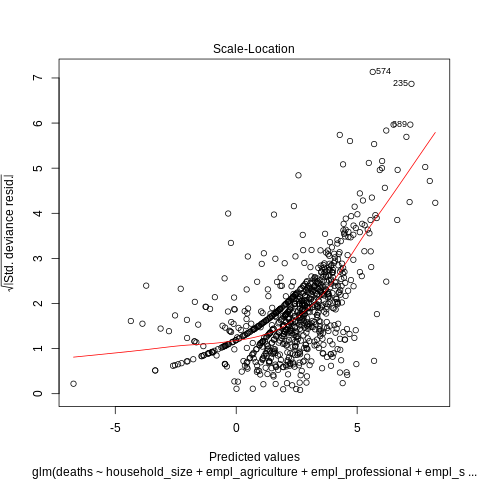

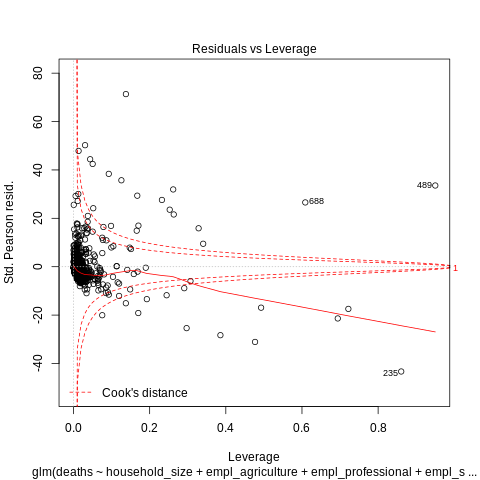

In [138]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured +
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + 
          order + density, family = poisson(link = "log"), data = abbrev)

print(summary(mod))
plot(mod)

In [139]:
formulas[1]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'


Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density + cases_march24, family = poisson(link = "log"), 
    data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-29.230   -3.828   -1.649    0.683   43.966  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)            2.392871   0.013244 180.675  < 2e-16 ***
household_size         0.004028   0.008376   0.481   0.6306    
empl_agriculture      -0.878257   0.022439 -39.140  < 2e-16 ***
empl_professional     -0.210930   0.013631 -15.475  < 2e-16 ***
empl_social           -0.100085   0.011102  -9.015  < 2e-16 ***
empl_services         -0.38

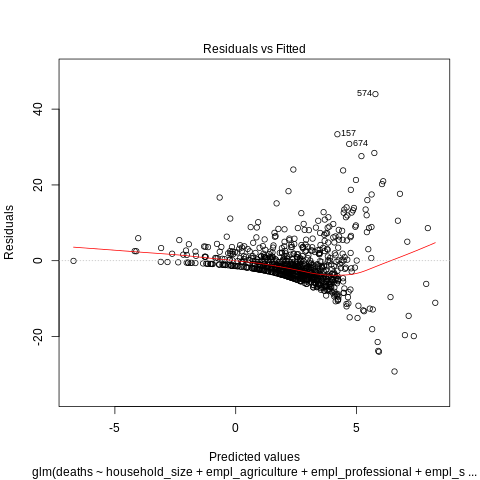

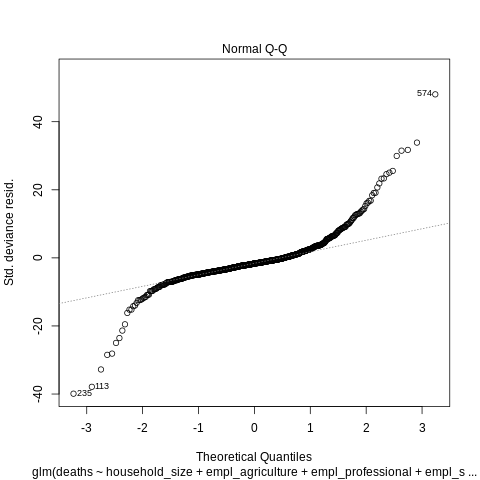

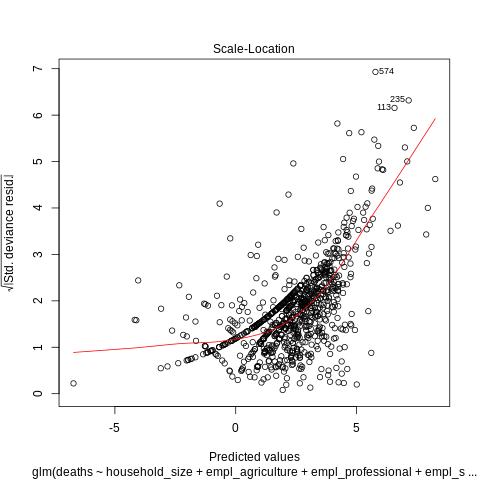

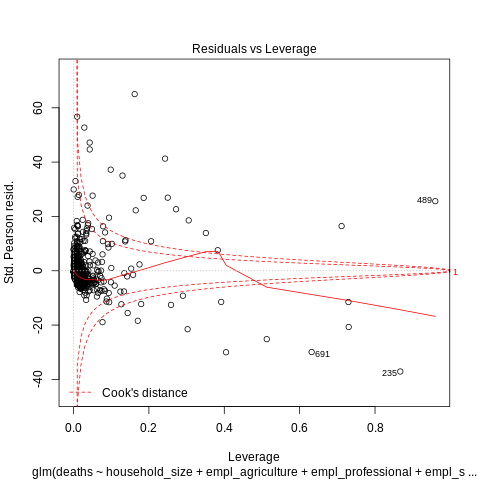

In [140]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + 
          area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + 
          density + cases_march24, family = poisson(link = "log"), data = abbrev)

print(summary(mod))
plot(mod)

In [141]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'


Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = poisson(link = "log"), data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-24.483   -3.114   -1.344    0.828   37.502  

Coefficients:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)               2.274045   0.013162 172.775  < 2e-16 ***
household_size            0.094064   0.008493  11.076  < 2e-16 ***
empl_professional        -0.484505   0.013008 -37.247  < 2e-16 ***
empl_social              -0.084603   0.011685  -7.240 4.48e-13 ***
empl_services            -0.230853   0.010238 -22.548  < 2e-

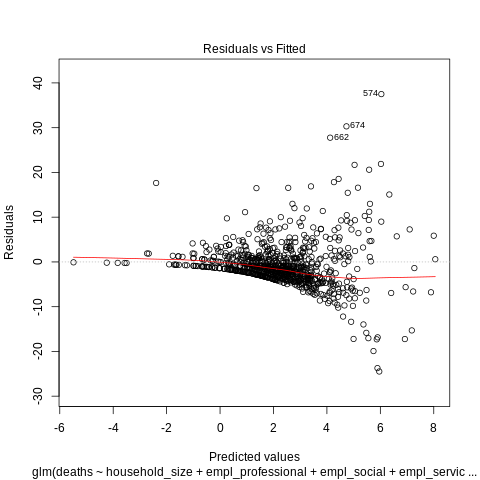

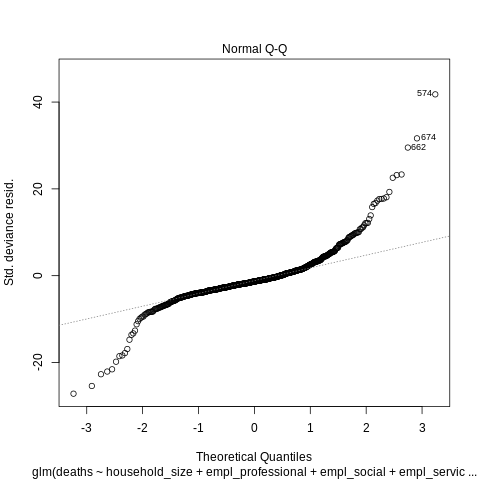

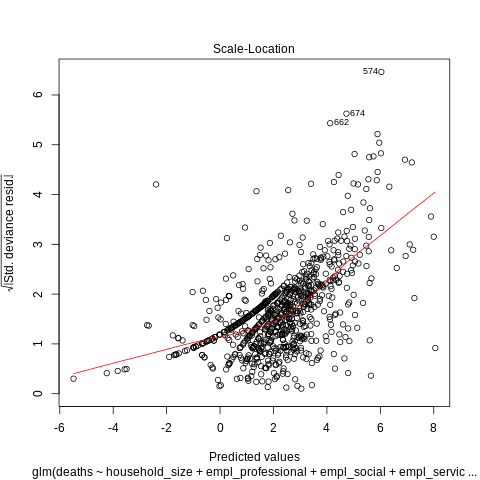

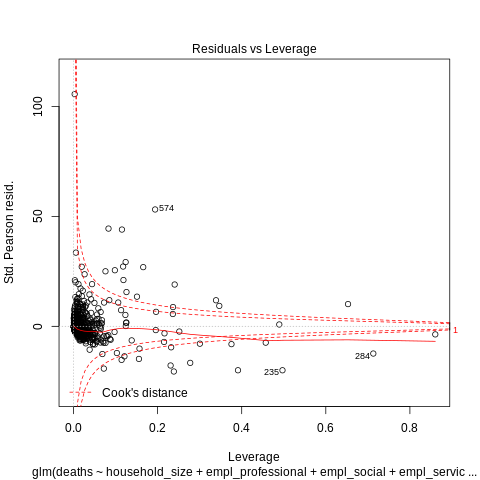

In [142]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = poisson(link = "log"), data = abbrev)

print(summary(mod))
plot(mod)

## Quasipoisson Family GLM

In [206]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'


Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density, family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-28.541   -3.748   -1.640    0.711   47.267  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.371038   0.096317  24.617  < 2e-16 ***
household_size         0.026324   0.061228   0.430 0.667364    
empl_agriculture      -0.843034   0.161416  -5.223 2.25e-07 ***
empl_professional     -0.287384   0.096207  -2.987 0.002902 ** 
empl_social           -0.112237   0.079003  -1.421 0.155799    
empl_services         -0.332737   0.074679  -4.456 9.55e-

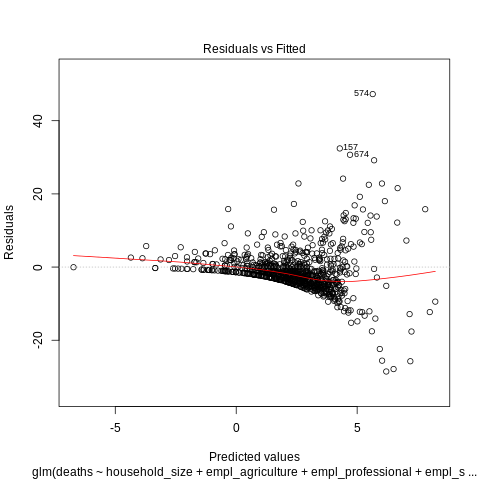

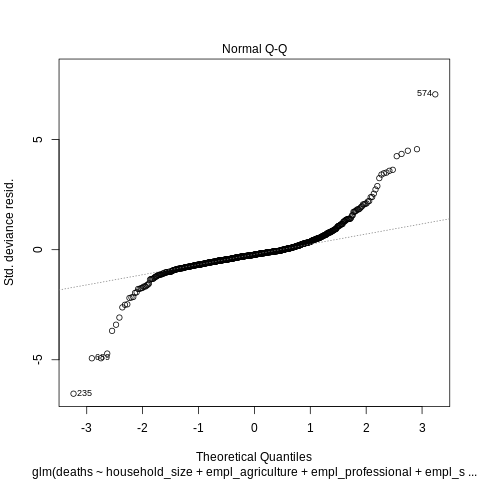

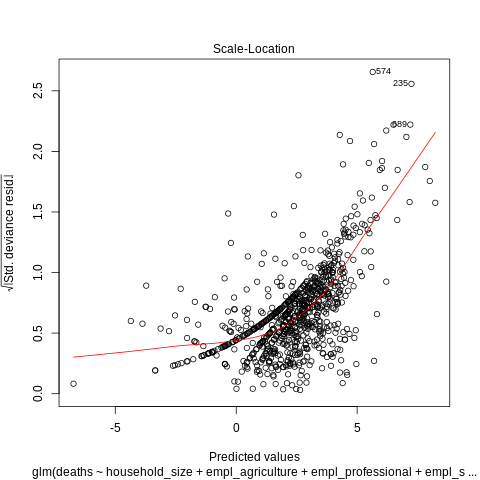

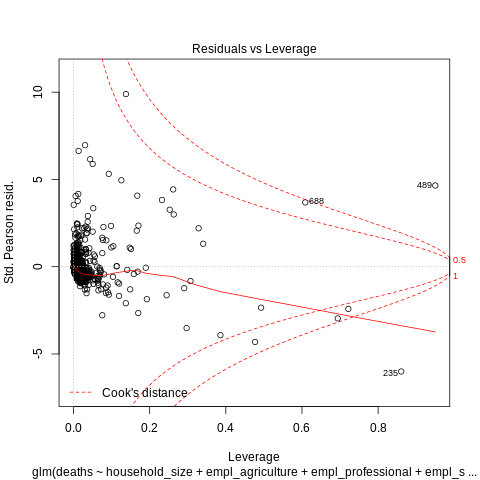

In [207]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + 
          uninsured + area + incarcerated + domestic_passengers + intl_passengers + 
          prc_obese + ten_plus + order + density, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

In [209]:
formulas[1]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density + cases_march24'


Call:
glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + 
    population + pop_65_plus + uninsured + area + incarcerated + 
    domestic_passengers + intl_passengers + prc_obese + ten_plus + 
    order + density + cases_march24, family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-29.230   -3.828   -1.649    0.683   43.966  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.392871   0.096925  24.688  < 2e-16 ***
household_size         0.004028   0.061302   0.066 0.947631    
empl_agriculture      -0.878257   0.164217  -5.348 1.16e-07 ***
empl_professional     -0.210930   0.099754  -2.114 0.034781 *  
empl_social           -0.100085   0.081247  -1.232 0.218363    
empl_services         -0.384434   0.07876

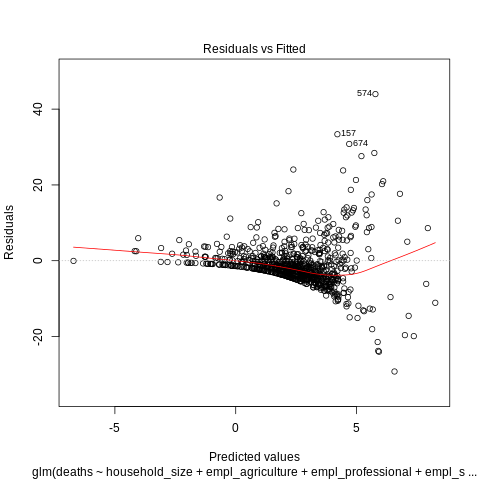

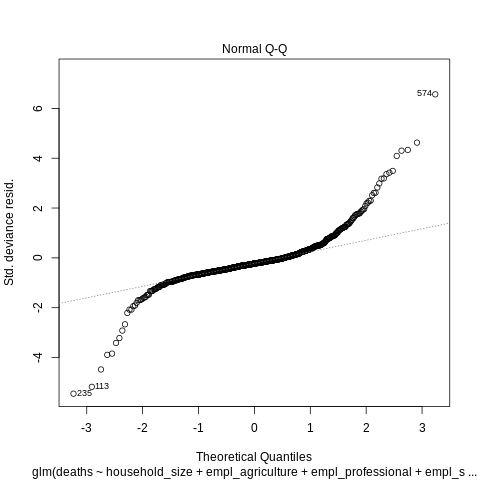

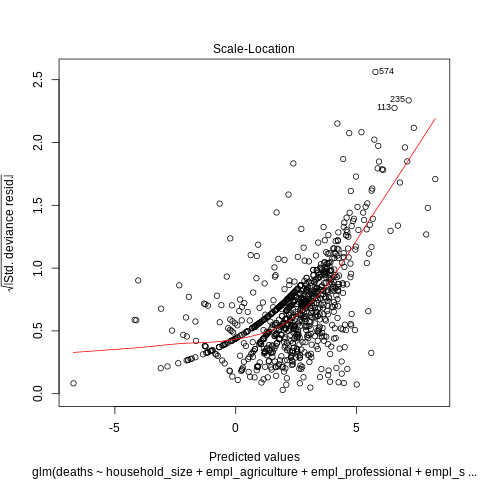

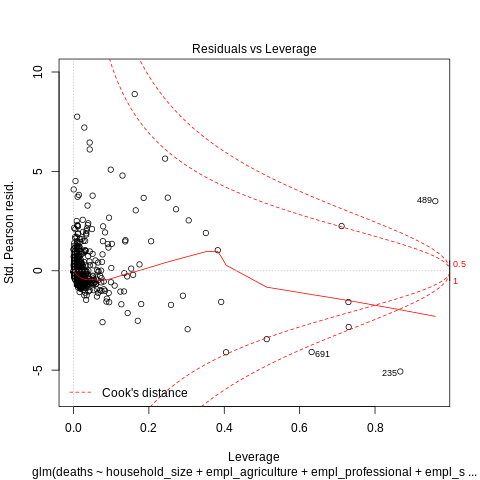

In [210]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + 
          uninsured + area + incarcerated + domestic_passengers + intl_passengers + 
          prc_obese + ten_plus + order + density + cases_march24, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

In [201]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'


Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-24.483   -3.114   -1.344    0.828   37.502  

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)               2.274045   0.091175  24.941  < 2e-16 ***
household_size            0.094064   0.058831   1.599 0.110241    
empl_professional        -0.484505   0.090109  -5.377 9.94e-08 ***
empl_social              -0.084603   0.080947  -1.045 0.296262    
empl_services            -0.230853   0.070924  -3.255 0.001182 ** 
em

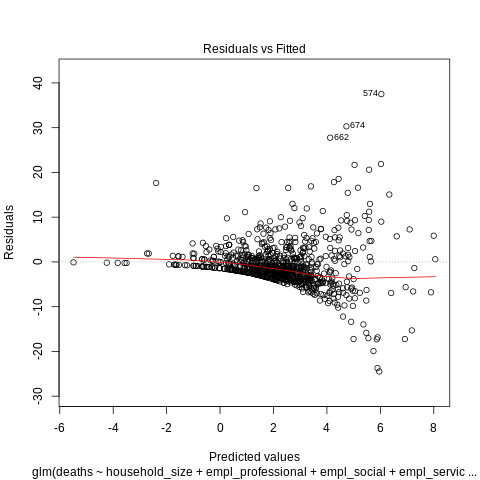

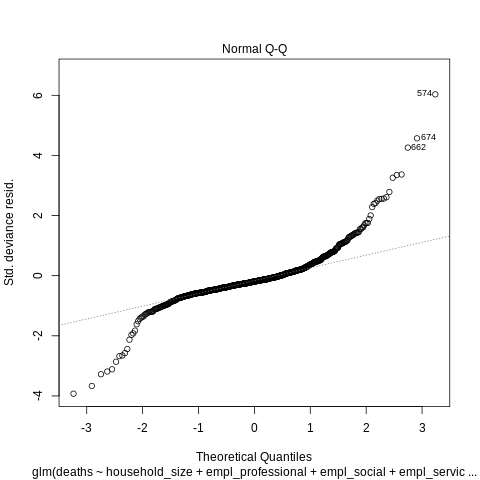

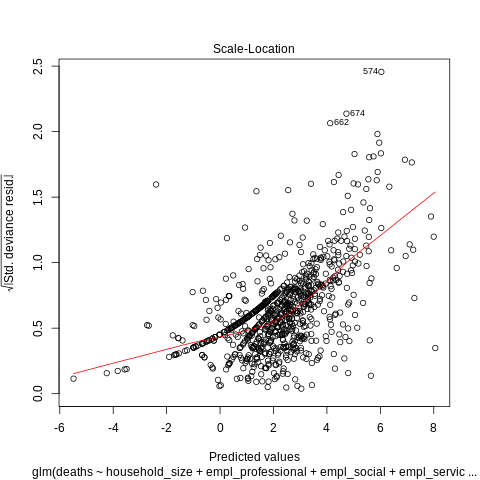

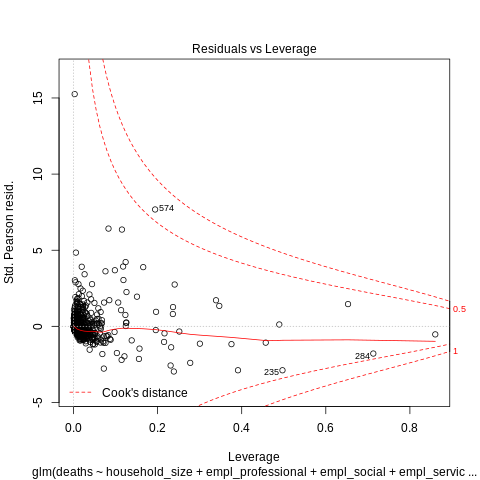

In [205]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

# high dispersion since dispersion parameter = 47.something > 1
# https://cran.r-project.org/web/packages/pscl/vignettes/countreg.pdf

#actually respects assumption of linearity for poisson??
# https://bookdown.org/egarpor/PM-UC3M/glm-diagnostics.html

In [211]:
formulas[3]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'


Call:
glm(formula = deaths ~ household_size + empl_professional + empl_social + 
    empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
    prc_fam_poverty + avg_income + pop_65_plus + uninsured + 
    prc_obese + ten_plus + order + log_population + log_density + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    cases_march24, family = quasipoisson, data = abbrev)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-23.724   -3.189   -1.457    0.674   36.469  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)               2.30624    0.09347  24.673  < 2e-16 ***
household_size            0.09387    0.05946   1.579 0.114767    
empl_professional        -0.43689    0.09483  -4.607 4.75e-06 ***
empl_social              -0.06986    0.08324  -0.839 0.401565    
empl_services            -0.25160    0.07449  -3.378 0.000

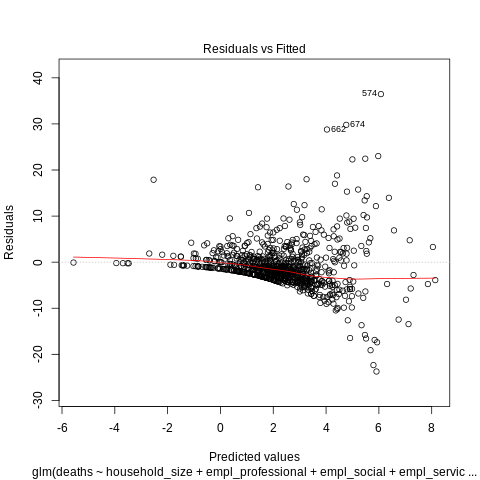

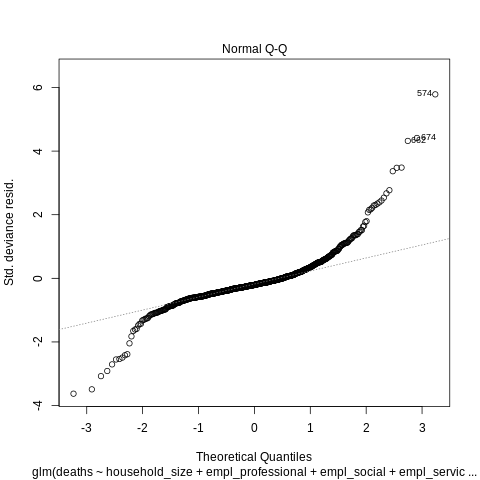

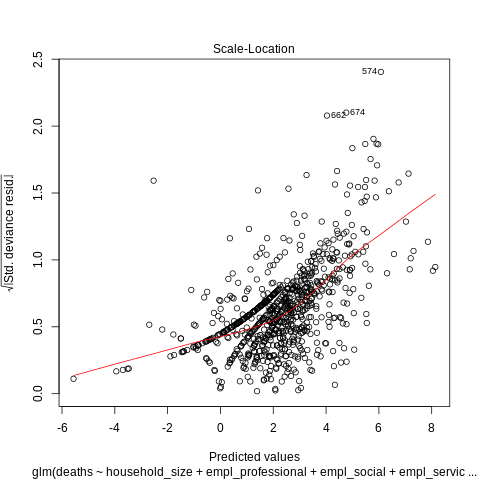

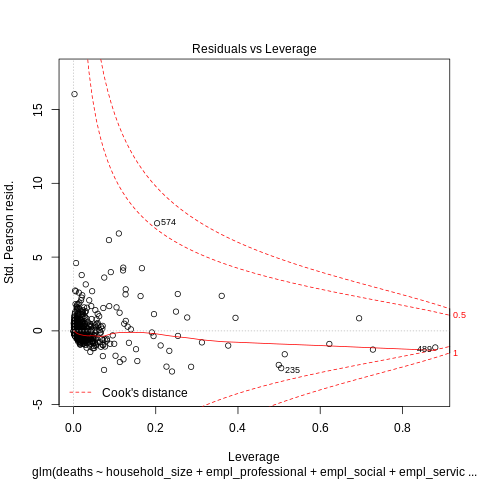

In [212]:
%%R -i abbrev

mod = glm(formula = deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp + cases_march24, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

## Quasipoisson Family GLM with Transformed Response Variable

In [213]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'


Call:
glm(formula = log_deaths ~ household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density, family = quasipoisson, 
    data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.95606  -0.63048  -0.00856   0.45448   1.76431  

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            0.537055   0.021198  25.335  < 2e-16 ***
household_size         0.007549   0.024524   0.308 0.758287    
empl_agriculture      -0.091105   0.027075  -3.365 0.000802 ***
empl_professional      0.004759   0.037356   0.127 0.898665    
empl_social           -0.009196   0.028030  -0.328 0.742937    
empl_services         -0.074824   0.02

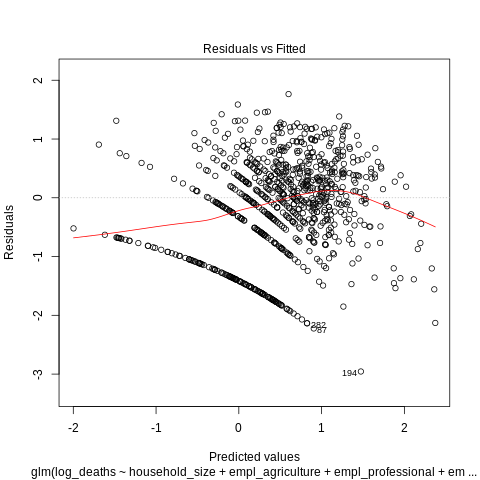

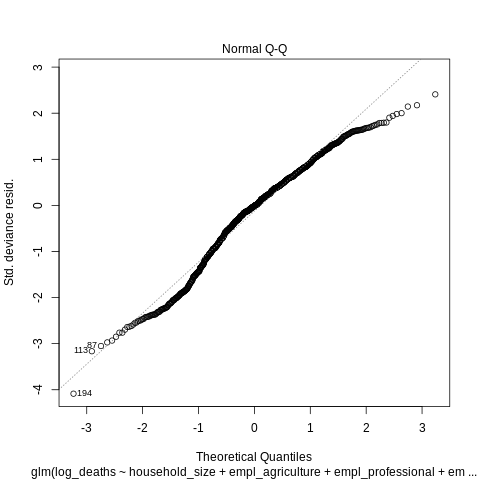

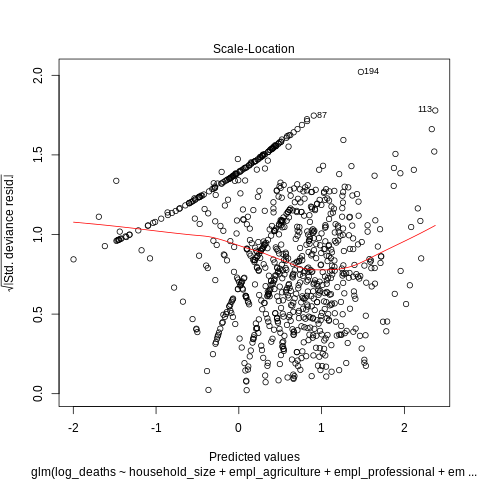

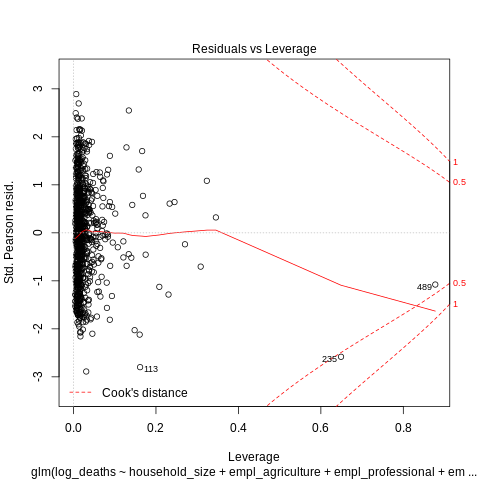

In [216]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_agriculture + empl_professional + empl_social + 
          empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + 
          prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + 
          uninsured + area + incarcerated + domestic_passengers + intl_passengers + 
          prc_obese + ten_plus + order + density, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

In [218]:
formulas[2]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp'


Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
    family = quasipoisson, data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.90828  -0.60203  -0.00428   0.44174   2.33691  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              0.534045   0.020648  25.864  < 2e-16 ***
household_size           0.016092   0.023726   0.678 0.497804    
empl_professional       -0.057803   0.036988  -1.563 0.118507    
empl_social              0.011360   0.028352   0.401 0.688768    
empl_services           -0.057527   0.024628  -2.336 0.01974

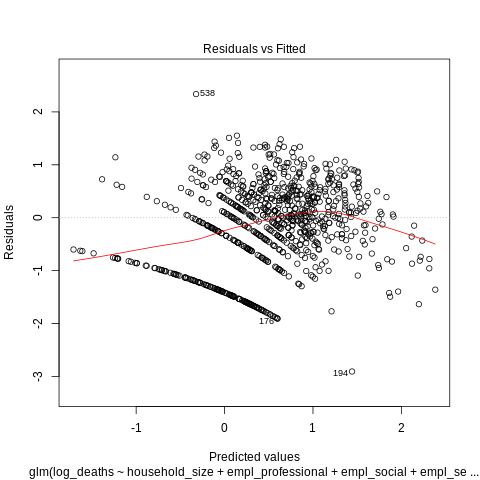

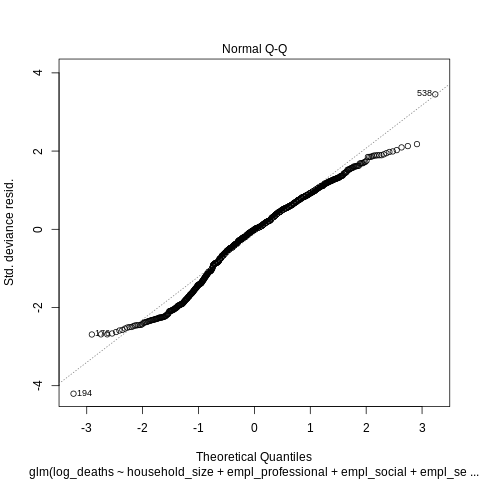

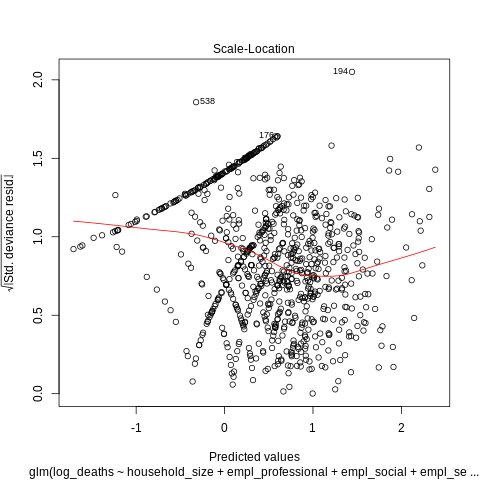

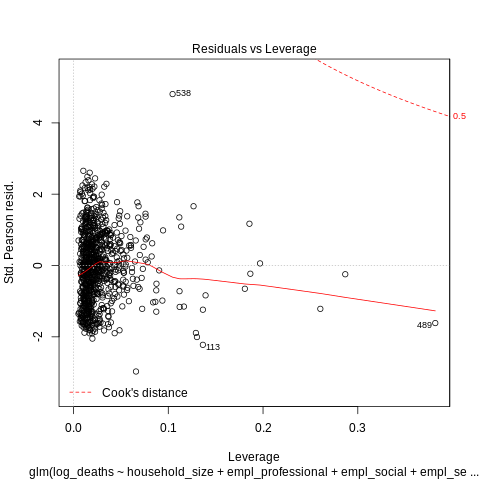

In [219]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)


Call:
glm(formula = log_deaths ~ household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_density + log_intl_passengers + log_domestic_passengers + 
    log_area + log_incarcerated + log_empl_agriculture + log_prc_public_transp + 
    log_cases_march24, family = quasipoisson, data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.89041  -0.59578  -0.00455   0.45124   2.34018  

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              0.535102   0.020715  25.832  < 2e-16 ***
household_size           0.015710   0.023737   0.662 0.508264    
empl_professional       -0.054756   0.037409  -1.464 0.143664    
empl_social              0.011762   0.028382   0.414 0.678687    
empl_services           -0.056783   0.02

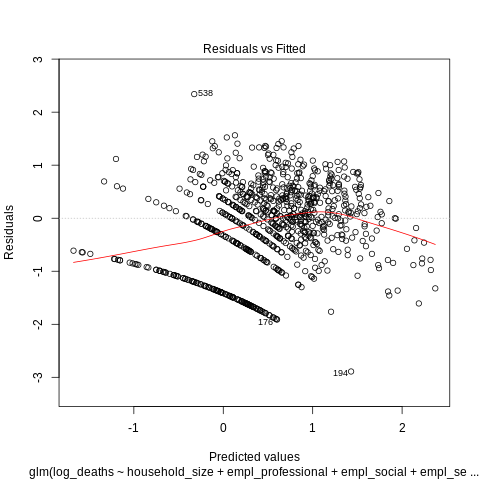

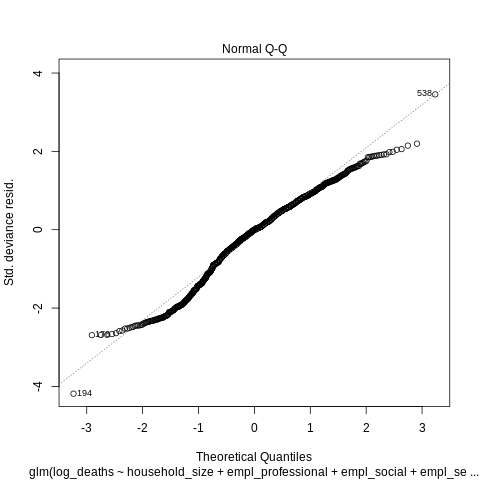

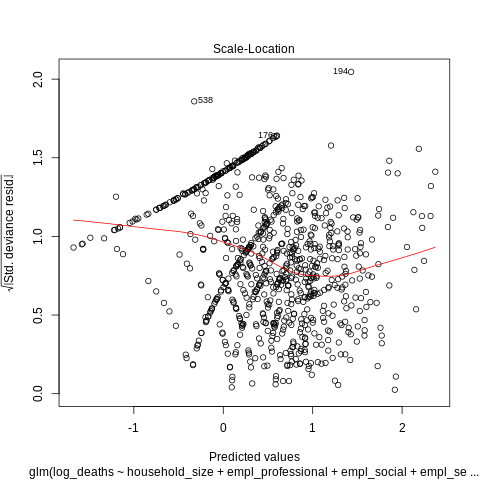

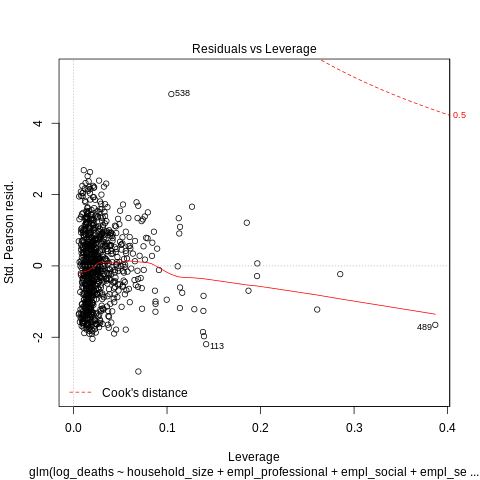

In [221]:
%%R -i abbrev
#formulas[3]
mod = glm(formula = log_deaths ~ household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_density + log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp + log_cases_march24, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

## Pseudopoisson with 2ndOrder Interactions and Transformed Response 

In [224]:
formulas[0]

'deaths ~ household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density'


Call:
glm(formula = log_deaths ~ (household_size + empl_agriculture + 
    empl_professional + empl_social + empl_services + empl_manufacturing + 
    empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + 
    prc_public_transp + population + pop_65_plus + uninsured + 
    area + incarcerated + domestic_passengers + intl_passengers + 
    prc_obese + ten_plus + order + density)^2, family = quasipoisson, 
    data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.56346  -0.46236  -0.01907   0.36563   1.64496  

Coefficients: (1 not defined because of singularities)
                                            Estimate Std. Error t value
(Intercept)                                0.5664627  0.1121691   5.050
household_size                            -0.0161069  0.0593307  -0.271
empl_agriculture                          -0.2790332  0.1488566  -1.875
empl_professional                         -0.0495261  0.0896600  -0.552
empl_social      

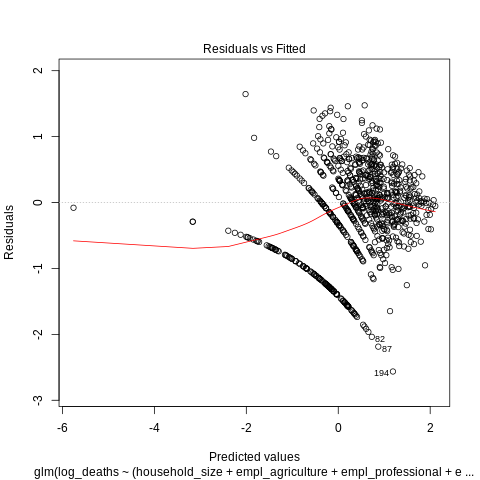

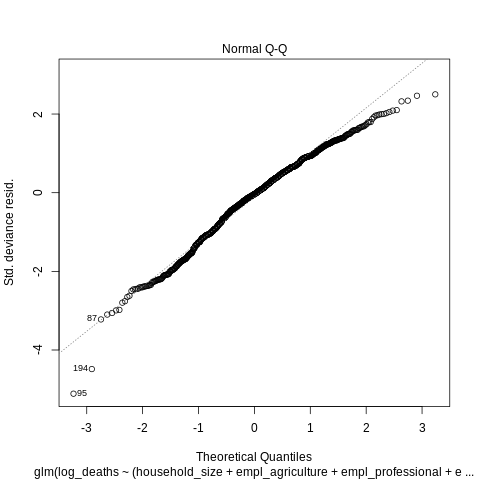

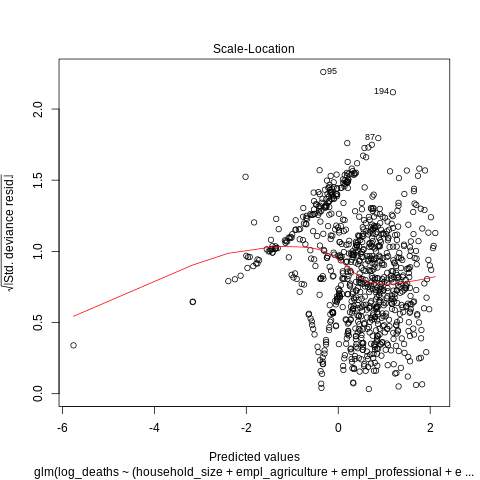

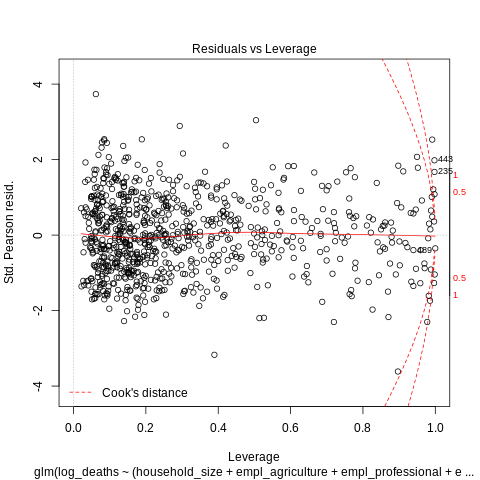

In [225]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ (household_size + empl_agriculture + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + prc_public_transp + population + pop_65_plus + uninsured + area + incarcerated + domestic_passengers + intl_passengers + prc_obese + ten_plus + order + density)^2, 
          family = quasipoisson, data = abbrev)

print(summary(mod))
plot(mod)

In [223]:
formulas[3]

'deaths ~ household_size + empl_professional + empl_social + empl_services + empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + log_density + log_intl_passengers + log_domestic_passengers + log_area + log_cases_march24 + log_incarcerated + log_empl_agriculture + log_prc_public_transp'


Call:
glm(formula = log_deaths ~ (household_size + empl_professional + 
    empl_social + empl_services + empl_manufacturing + empl_retail + 
    empl_transp_utilities + prc_fam_poverty + avg_income + pop_65_plus + 
    uninsured + prc_obese + ten_plus + order + log_population + 
    log_intl_passengers + log_domestic_passengers + log_area + 
    log_incarcerated + log_empl_agriculture + log_prc_public_transp)^2, 
    family = quasipoisson, data = abbrev)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.34130  -0.46240  -0.03347   0.35295   1.89729  

Coefficients:
                                                Estimate Std. Error t value
(Intercept)                                    0.5882680  0.1010209   5.823
household_size                                -0.0063440  0.0495765  -0.128
empl_professional                             -0.0732030  0.0643968  -1.137
empl_social                                   -0.0003528  0.0528624  -0.007
empl_services       

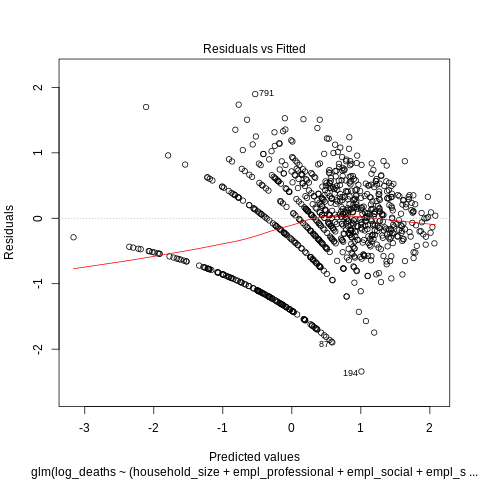

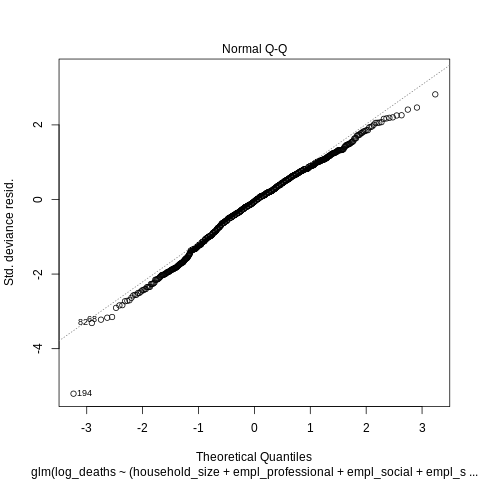

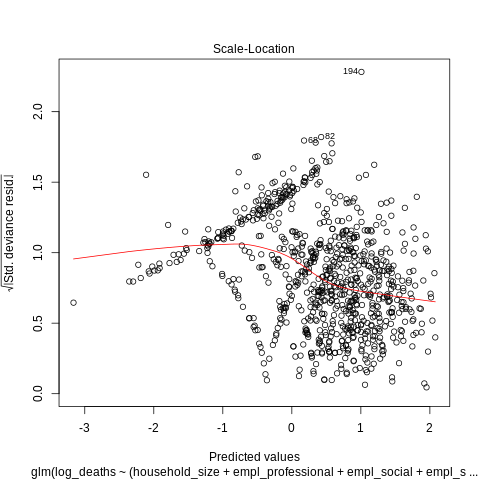

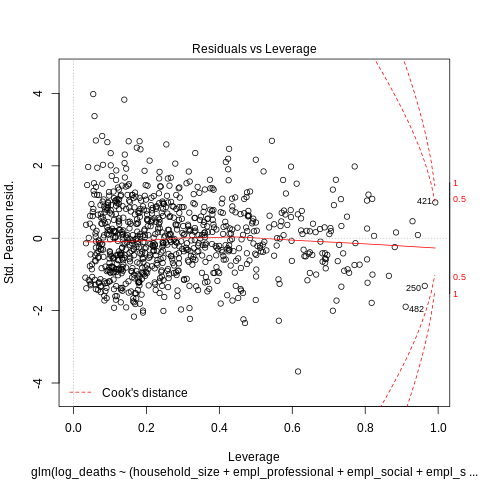

In [248]:
%%R -i abbrev

mod = glm(formula = log_deaths ~ (household_size + empl_professional + empl_social + empl_services + 
          empl_manufacturing + empl_retail + empl_transp_utilities + prc_fam_poverty + 
          avg_income + pop_65_plus + uninsured + prc_obese + ten_plus + order + log_population + 
          log_intl_passengers + log_domestic_passengers + log_area + 
          log_incarcerated + log_empl_agriculture + log_prc_public_transp)^2, 
          family = quasipoisson, data = abbrev)
print(summary(mod))
plot(mod)

In [245]:
print(indp_vars[2])

['household_size', 'empl_professional', 'empl_social', 'empl_services', 'empl_manufacturing', 'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty', 'avg_income', 'pop_65_plus', 'uninsured', 'prc_obese', 'ten_plus', 'order', 'log_population', 'log_density', 'log_intl_passengers', 'log_domestic_passengers', 'log_area', 'log_incarcerated', 'log_empl_agriculture', 'log_prc_public_transp']


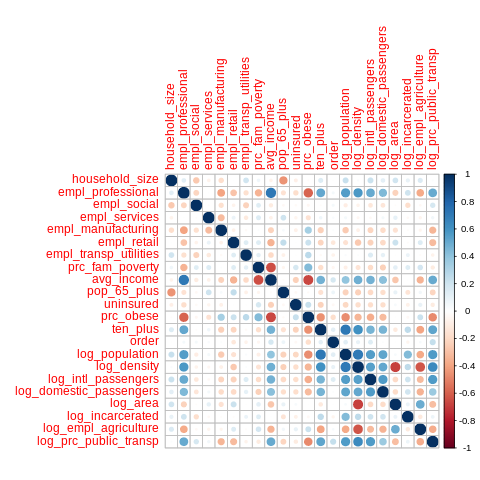

In [247]:
%%R

library(corrplot)
corrplot(cor(abbrev[c('household_size', 'empl_professional', 'empl_social', 'empl_services', 'empl_manufacturing', 'empl_retail', 'empl_transp_utilities', 'prc_fam_poverty', 'avg_income', 'pop_65_plus', 'uninsured', 'prc_obese', 'ten_plus', 'order', 'log_population', 'log_density', 'log_intl_passengers', 'log_domestic_passengers', 'log_area', 'log_incarcerated', 'log_empl_agriculture', 'log_prc_public_transp')]))

In [239]:
%%R

step = step(mod, direction="backward", scale=0)

R[write to console]: Error in step(mod, direction = "backward", scale = 0) : 
  AIC is not defined for this model, so 'step' cannot proceed

R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: 
R[write to console]: In sqrt(crit * p * (1 - hh)/hh) :
R[write to console]:  NaNs produced

R[write to console]: 2: 
R[write to console]: In sqrt(crit * p * (1 - hh)/hh) :
R[write to console]:  NaNs produced




Error in step(mod, direction = "backward", scale = 0) : 
  AIC is not defined for this model, so 'step' cannot proceed
